In [100]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import datetime
import matplotlib.dates as md
import matplotlib.ticker as ticker
from scipy import stats
import numpy as np

In [101]:
Dots = pd.read_csv('Data_Level4_UMDOTS_CampusTrafficCount.csv')
Dots['Date'] = Dots['time'].str[:10]
Dots['Date'] = pd.to_datetime(Dots['Date'])
Dots['StartTime'] = Dots['time'].str[11:19]
Dots['StartTime'] = pd.to_datetime(Dots['StartTime'])
Dots['StartTime'] = Dots['StartTime'].apply(lambda x: x.time())
Dots['time'] = pd.to_datetime(Dots['time'].str[:10]+' '+Dots['time'].str[11:19])

In [102]:
def loca_into_five(a):
    if 'Gate' in a:
        return "Baltimore Avenue & Regents Drive (South Gate)"
    elif ('Campus' in a) & ('Paint' in a):
        return "Campus Drive & Paint Branch Drive"
    elif ('Regents' in a) & ('Stadium' in a):
        return "Stadium Drive & Regents Drive"
    else:
        return a

In [103]:
def temperature(a):
    if a.date()==datetime.date(2019,10,29):
        return 58.3
    elif a.date()==datetime.date(2019,10,30):
        return 57.1
    elif a.date()==datetime.date(2019,10,31):
        return 57.3
    elif a.date()==datetime.date(2019,11,1):
        return 43.9
    elif a.date()==datetime.date(2019,11,2):
        return 38.9
    elif a.date()==datetime.date(2019,11,3):
        return 40.0
    elif a.date()==datetime.date(2019,11,4):
        return 44.1
    elif a.date()==datetime.date(2019,11,5):
        return 45.9
    elif a.date()==datetime.date(2019,11,6):
        return 44.3
    elif a.date()==datetime.date(2019,11,7):
        return 49.7
    elif a.date()==datetime.date(2019,11,8):
        return 37.4
    elif a.date()==datetime.date(2019,11,9):
        return 32.6
    elif a.date()==datetime.date(2019,11,10):
        return 41.8
    elif a.date()==datetime.date(2019,11,11):
        return 50.2
    elif a.date()==datetime.date(2019,10,28):
        return 57.4


In [104]:
def calculate_center(a):
    return a[0]*a[1]+a[1]/2 if a[1]/2!=0.25 else a[0]*a[1]

In [105]:
def class_peaks(a):
    #print (a.values[1])
    if (a[1] in [1,3,5]) &(a[0] in np.arange(7.75,18.75,1.0)):
        return 1
    elif (a[1] in [2,4])& (a[0] in np.arange(7.75,19,1.5)):
        return 1
    else:
        return -1

In [106]:
def rounded_time(df):
    
    df_refined=df.copy()
    df_refined['dif']=df_refined['weekday'].apply(lambda x: 1 if x in [1,3,5] else (1.5 if x in [2,4] else 0.25))
    df_refined['idx']=df_refined[['hour','dif']].apply(lambda x:np.floor_divide(x[0], x[1]),axis=1)
    df_refined=df_refined.drop(columns=["hour"])
    df_output=df_refined.groupby(['Date','idx',"temp"],as_index=False).mean()
    df_output['center_time']=df_output[['idx','dif']].apply(calculate_center, axis=1)
    
    return df_output

In [107]:
Dots['location_5'] = Dots['location'].apply(loca_into_five)
Dots['weekday'] = Dots['Date'].apply(lambda x: x.weekday()+1)
import os
if not os.path.exists("figs"):
    os.makedirs("figs")

Dots_sensor_1=Dots[Dots['location_5']=='Campus Drive & Paint Branch Drive']
Dots_sensor_other=Dots[Dots['location_5']!='Campus Drive & Paint Branch Drive']
Dots_sensor_2=Dots[Dots['location_5']=='Stadium Drive & Regents Drive']
Dots_sensor_other=Dots_sensor_other[Dots_sensor_other['location_5']!='Stadium Drive & Regents Drive']
Dots_sensor_3=Dots[Dots['location_5']=='Baltimore Avenue & Regents Drive (South Gate)']
Dots_sensor_other=Dots_sensor_other[Dots_sensor_other['location_5']!='Baltimore Avenue & Regents Drive (South Gate)']

Dots_sensor_1=Dots_sensor_1.groupby(['time','location_5','Date','StartTime','weekday'],as_index=False).mean()
Dots_sensor_2=Dots_sensor_2.groupby(['time','location_5','Date','StartTime','weekday'],as_index=False).mean()
Dots_sensor_3=Dots_sensor_3.groupby(['time','location_5','Date','StartTime','weekday'],as_index=False).mean()
Dots_sensor_other=Dots_sensor_other.drop(columns=['location'])

for i in ['pedestrians','bicyclists','cars','buses','trucks']:
    Dots_sensor_2[i]=Dots_sensor_2[i]*2

Dots_mod=Dots_sensor_1.append([Dots_sensor_2,Dots_sensor_3,Dots_sensor_other],ignore_index=False)

D:\Users\mrzcl\Anaconda3\envs\homework1\lib\site-packages\pandas\core\frame.py:6201: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=True'.

To retain the current behavior and silence the warning, pass sort=False

  sort=sort)


## Generate Train-test data

In [108]:
from sklearn.model_selection import train_test_split

def generate_train_test_idx(df_input,locs,types,ratio):
    Dots_list=[]
    train_idx_list=[]
    test_idx_list=[]
    for i in locs:
        Dots_list.append(df_input[df_input["location_5"]==i])
    
    for i in range(len(locs)):
        df=Dots_list[i]
        idx=range(df.shape[0])
        train_idx,test_idx=train_test_split(idx,test_size=ratio,random_state=0)
        train_idx_list.append(train_idx)
        test_idx_list.append(test_idx)
    return Dots_list,train_idx_list,test_idx_list
    



In [109]:
#This model would eleminate the game day
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn import svm

def model_1_for_no_gamedays(df,train_idx,test_idx):
    train_1=df.iloc[train_idx,:]
    train_1=train_1[train_1["is_gameday"]==-1] ##Eliminate the gameday
    train_1_rounded=rounded_time(train_1)
    train_x=train_1_rounded[["center_time","weekday",'temp']]
    train_y=train_1_rounded[['pedestrians','bicyclists','cars','buses','trucks']]
    #cols_to_norm = ['pedestrians','bicyclists','cars','buses','trucks']
    #train_y_norm=train_y[cols_to_norm].apply(lambda x: (x - x.min()) / (x.max() - x.min()))
    regr1=RandomForestRegressor()
    regr1.fit(train_x, train_y)
    test_1=df.iloc[test_idx,:]
    test_1=test_1[test_1["is_gameday"]==-1]
    test_1_x=test_1[["hour","weekday",'temp']]
    test_1_y=regr1.predict(test_1_x)
    train_temp_x=train_1[["hour","weekday",'temp']]
    train_temp_y_1=train_1[['pedestrians','bicyclists','cars','buses','trucks']]
    
    train_temp_y_2=np.nan_to_num(regr1.predict(train_temp_x[["hour","weekday",'temp']]))+0.001
    train_temp_y_3=train_temp_y_1-train_temp_y_2
    regr2=DecisionTreeRegressor()
    train_temp_x_2=train_1[["hour",'to_class_peak','num_peaks']]
    regr2.fit(train_temp_x_2, train_temp_y_3)
    test_2_x=test_1[["hour",'to_class_peak','num_peaks']]
    
    test_2_y=regr2.predict(test_2_x)
    test_y=test_2_y+test_1_y
    test_y[test_y < 0] = 0
    
    return test_y
    
        #true_y=test_1[['pedestrians','bicyclists','cars','buses','trucks']]
        #true_y_norm=true_y[cols_to_norm].apply(lambda x: (x - x.min()) / (x.max() - x.min()))
    

In [110]:
def to_class_peaks(a):
    ##Please enter the class schedule
    class_schedule={1:np.arange(7.75,18.75,1.0),
                   2:np.arange(7.75,19,1.5),
                   3:np.arange(7.75,18.75,1.0),
                   4:np.arange(7.75,19,1.5),
                   5:np.arange(7.75,18.75,1.0)}
    if a[1] in class_schedule:
        dif_min=np.amin(a[0]-class_schedule[a[1]])
        return dif_min
        
    return -1
    

In [111]:
def calculated_peak_number(a):
    class_schedule={1:np.arange(7.75,18.75,1.0),
                   2:np.arange(7.75,19,1.5),
                   3:np.arange(7.75,18.75,1.0),
                   4:np.arange(7.75,19,1.5),
                   5:np.arange(7.75,18.75,1.0)}
    
    if a in class_schedule:
        return class_schedule[a].size
        
    else:
        return 0

In [112]:
from sklearn.tree import DecisionTreeRegressor

def model_2_for_gameday(df,train_idx,test_idx):
    train_3=df.iloc[train_idx,:]
    train_3=train_3[train_3["is_gameday"]==1]
    test_3=df.iloc[test_idx,:]
    test_3=test_3[test_3["is_gameday"]==1]
    if test_3.shape[0]!=0:
        train_3_x=train_3[['to_FB_start','to_FB_end']]
        train_3_y=train_3[['pedestrians','bicyclists','cars','buses','trucks']]
        test_3_x=test_3[['to_FB_start','to_FB_end']]
        test_3_y=test_3[['pedestrians','bicyclists','cars','buses','trucks']]
        types=['pedestrians','bicyclists','cars','buses','trucks']
        
        regr3=DecisionTreeRegressor()
        regr3.fit(train_3_x, train_3_y)
        test_3_y=regr3.predict(test_3_x)
            
        test_3_y[test_3_y < 0] = 0
        return test_3_y

## General Testing

R2=0.7722732049641129


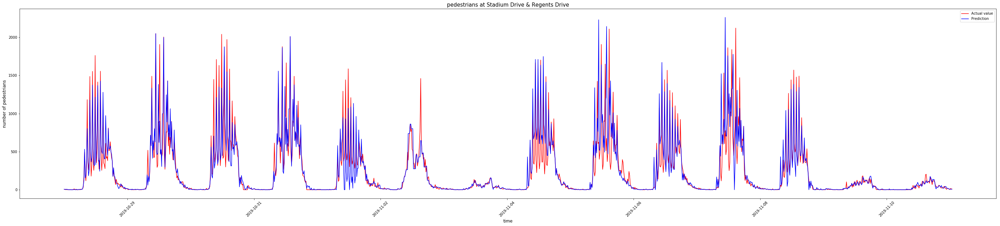

R2=0.8109763912716292


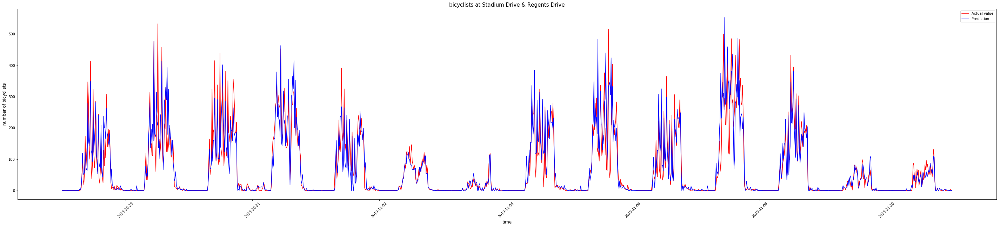

R2=0.9213597032615027


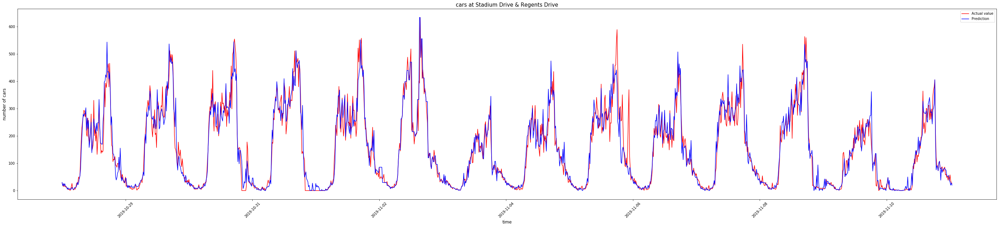

R2=0.8570708544995777


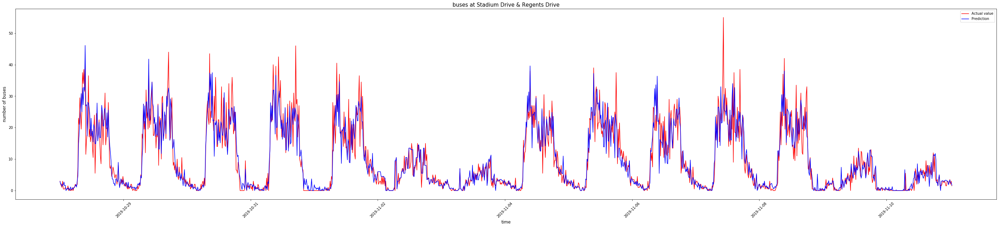

R2=0.8829982610995


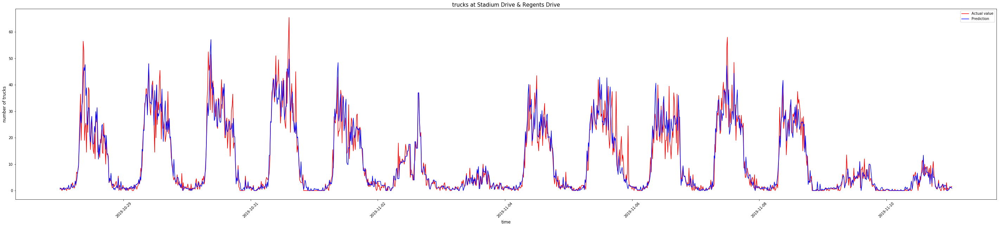

R2=0.6055401030215894


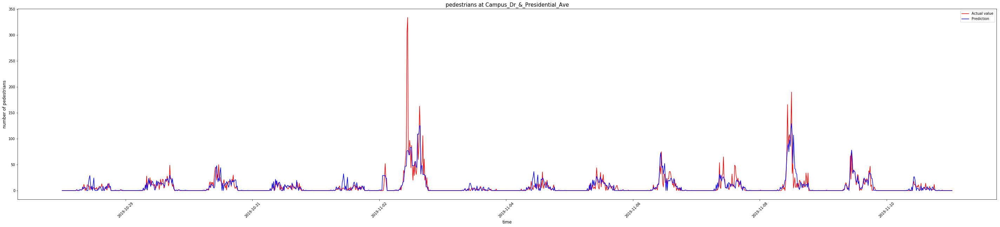

R2=0.38874365639786645


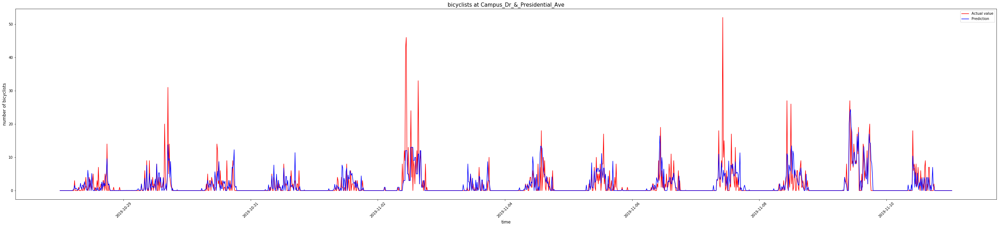

R2=0.9064499403816393


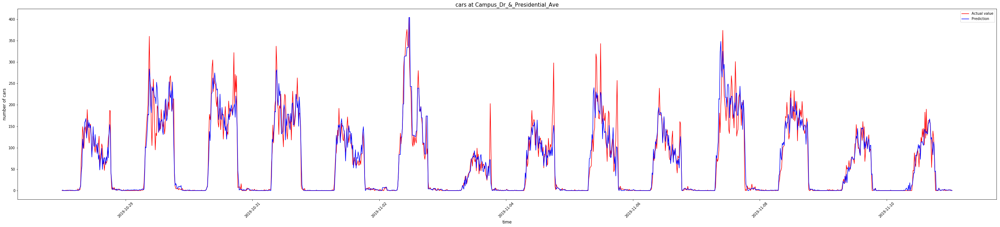

R2=0.674822076403758


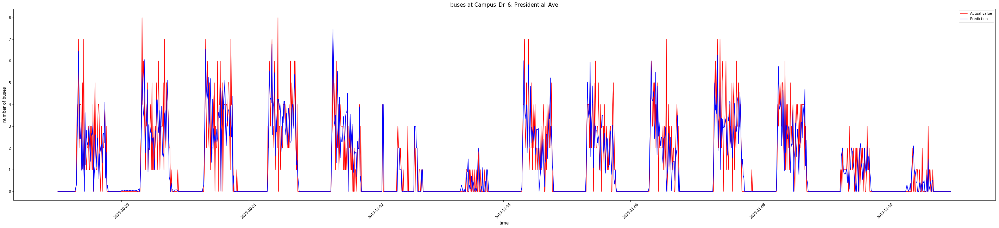

R2=0.7570141827587322


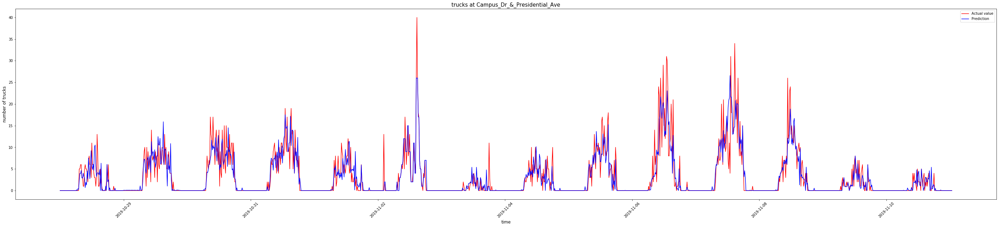

R2=0.5947753496752317


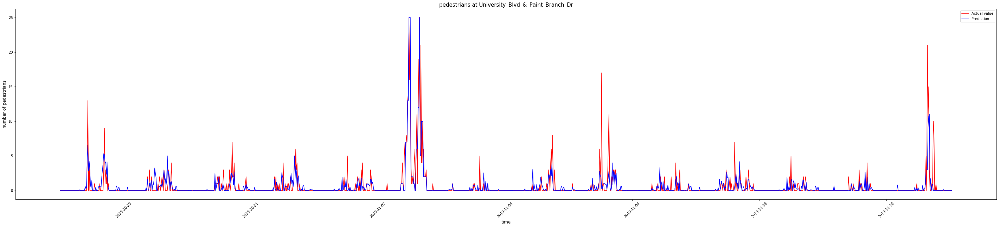

R2=0.6376575871350088


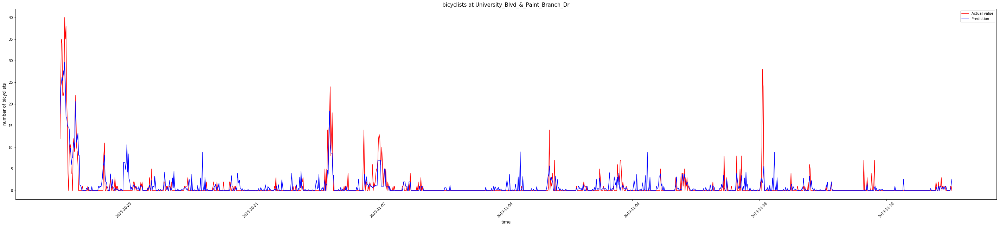

R2=0.9158541501819493


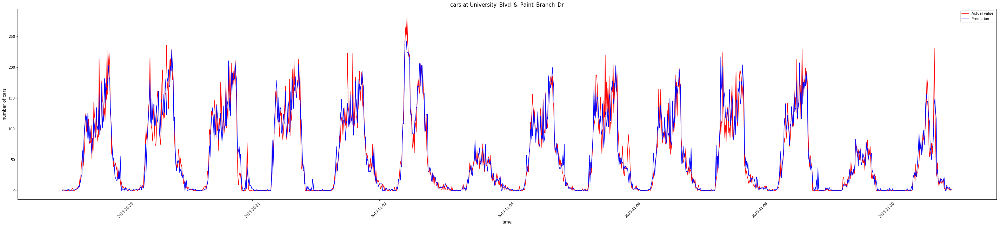

R2=0.498718519724212


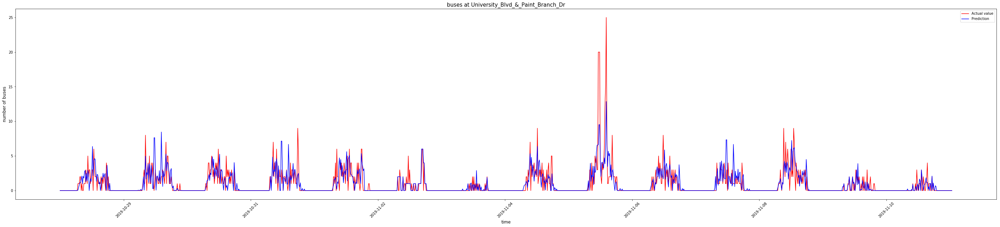

R2=0.8173249633176474


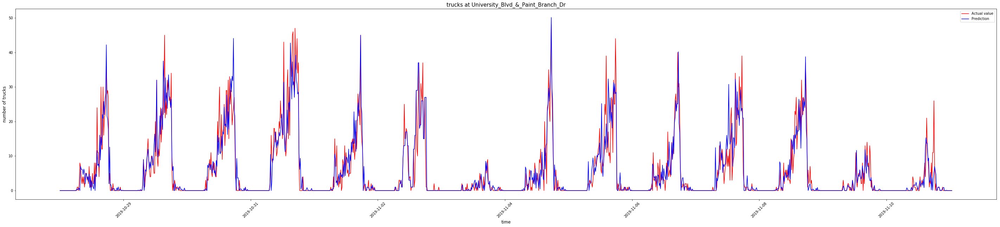

R2=0.8214179203823814


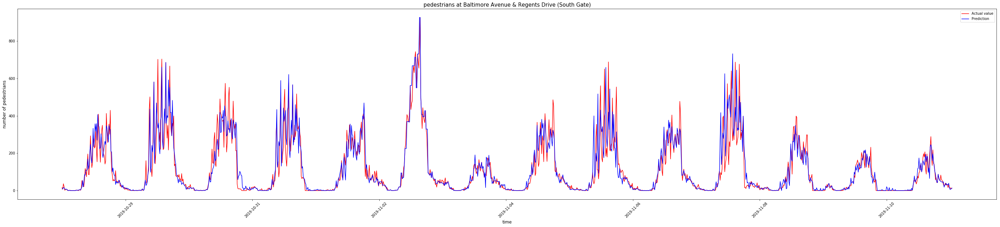

R2=0.7169663090878973


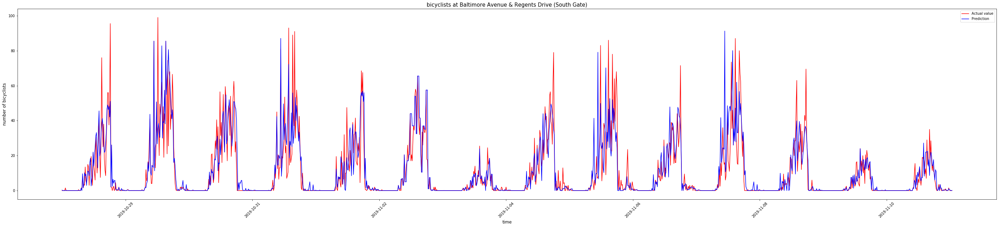

R2=0.950274499710645


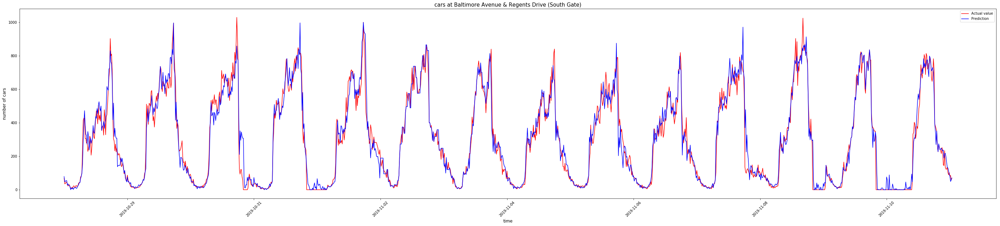

R2=0.7272117062382415


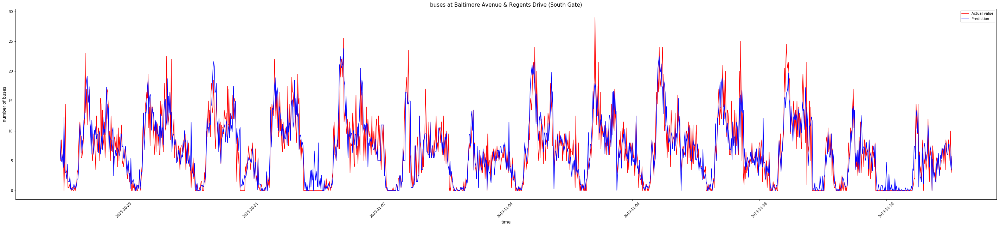

R2=0.8101317206665251


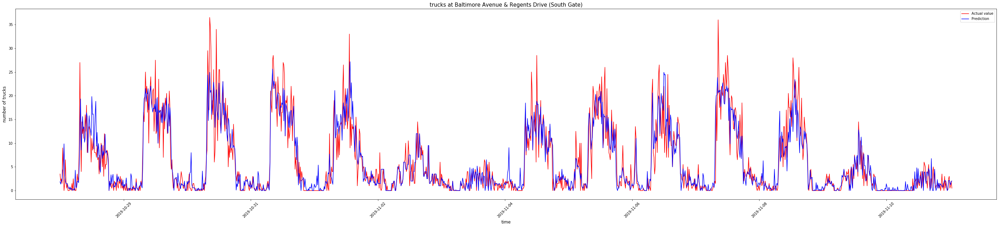

R2=0.6410056200008912


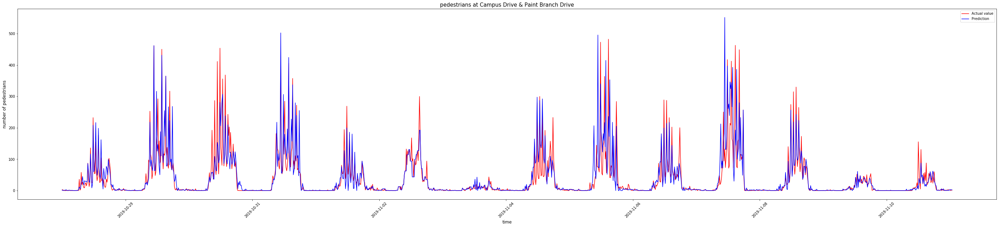

R2=0.5148599970425082


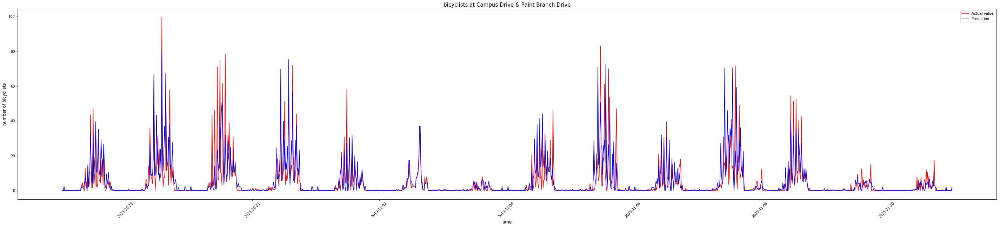

R2=0.9096280011531129


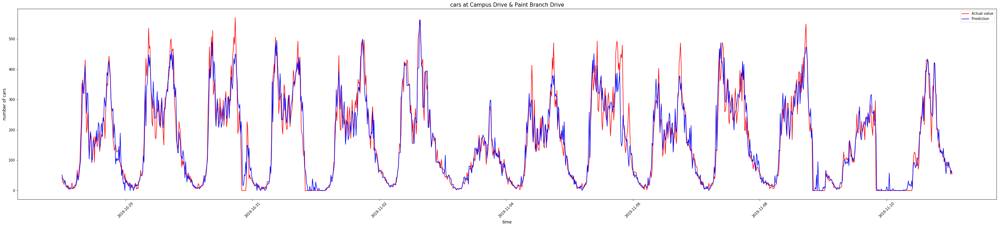

R2=0.8724920609456803


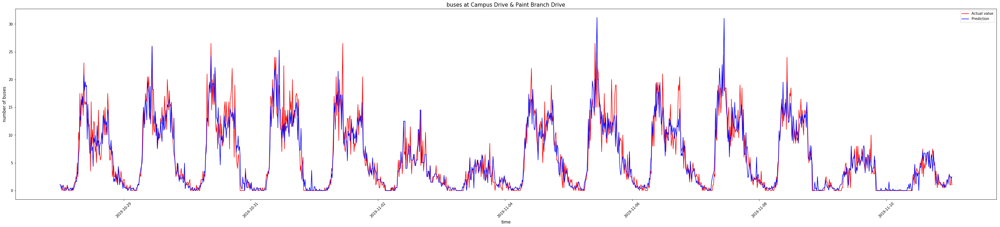

R2=0.8541827682835986


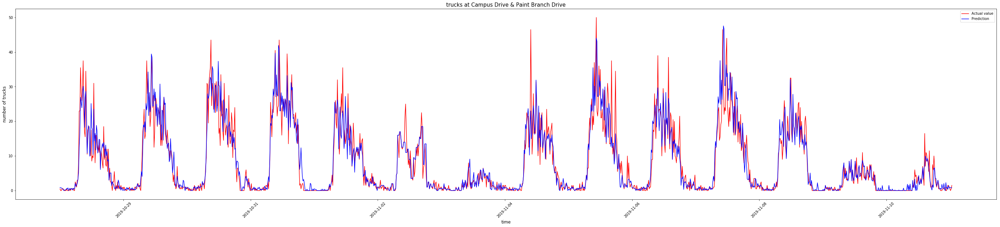

In [113]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import r2_score
from sklearn.ensemble import RandomForestRegressor

#Data Preprocessing
Dots_mod['FB_start']=Dots_mod['Date'].apply(lambda x: 12 if x.date()==datetime.date(2019,11,2) else -1)
Dots_mod['FB_end']=Dots_mod['Date'].apply(lambda x: 15 if x.date()==datetime.date(2019,11,2) else -1)
Dots_mod['hour']=Dots_mod['StartTime'].apply(lambda x: (int(x.hour)+float(x.minute/60)))
Dots_mod['temp']=Dots_mod['Date'].apply(lambda x: temperature(x))
Dots_mod['is_weekend']=Dots_mod['weekday'].apply(lambda x: 1 if x==6 or x==7 else -1)
Dots_mod['is_gameday']=Dots_mod['Date'].apply(lambda x: 1 if x.date()==datetime.date(2019,11,2) else -1)
Dots_mod['to_FB_start']=Dots_mod[['hour','FB_start']].apply(lambda x: x[0]-x[1],axis=1)
Dots_mod['to_FB_end']=Dots_mod[['hour','FB_end']].apply(lambda x: x[0]-x[1],axis=1)
Dots_mod['to_class_peak']=Dots_mod[['hour','weekday']].apply(to_class_peaks,axis=1)
Dots_mod['num_peaks']=Dots_mod['weekday'].apply(calculated_peak_number)

#Dots_mod['BK_start']=Dots_mod['Date'].apply(lambda x: 19.5 if x.date()==datetime.date(2019,11,1) or x.date()==datetime.date(2019,11,5) else (21 if x.date()==datetime.date(2019,11,9) else -1))
#Dots_mod['BK_end']=Dots_mod['Date'].apply(lambda x: 22.5 if x.date()==datetime.date(2019,11,1) or x.date()==datetime.date(2019,11,5) else (24 if x.date()==datetime.date(2019,11,9) else -1))

Dots_input=Dots_mod.copy()

locs=['Stadium Drive & Regents Drive','Campus_Dr_&_Presidential_Ave','University_Blvd_&_Paint_Branch_Dr',
                 'Baltimore Avenue & Regents Drive (South Gate)','Campus Drive & Paint Branch Drive']
types=['pedestrians','bicyclists','cars','buses','trucks']
#It is the ratio of testing sample.
ratio=0.5
Dots_list,train_idx_list,test_idx_list=generate_train_test_idx(Dots_input,locs,types,ratio)


#analysis about the time


for i in range(len(locs)):
    df=Dots_list[i]
    idx=range(df.shape[0])
    #test_idx=test_idx_list[i]
    test_idx=idx
    train_idx=train_idx_list[i]
    
    test_y_1_int=model_1_for_no_gamedays(df,train_idx,test_idx)
    test_y_1=pd.DataFrame(data=test_y_1_int, columns=['pedestrians','bicyclists','cars','buses','trucks'])
    test_1=df.iloc[test_idx,:]
    test_1=test_1[test_1["is_gameday"]==-1]
    test_y_1['time']=test_1.time.values
    
    
    test_y_2_in=model_2_for_gameday(df,train_idx,test_idx)
    test_2=df.iloc[test_idx,:]
    test_2=test_2[test_2["is_gameday"]==1]
    test_y_2=pd.DataFrame(data=test_y_2_in, columns=['pedestrians','bicyclists','cars','buses','trucks'])
    test_y_2['time']=test_2.time.values
    
    test_y=test_y_1.append(test_y_2)
    test_y=test_y.sort_values(by='time',ascending=True)
    
    
    
    true_y=df.iloc[test_idx,:][['pedestrians','bicyclists','cars','buses','trucks']]
    x=df.iloc[test_idx,:].time
    
    
    
    
    for j in range(len(types)):
        acc=r2_score(true_y[types[j]], test_y.iloc[:,j])
        print ("R2="+ str(acc))
        fig = plt.figure(figsize=(50,10))
        ax = plt.subplot(111)
        ax.plot(x, true_y[types[j]], label='Actual value',color='r')
        ax.plot(x, test_y.iloc[:,j], label='Prediction',color='b')
        ax.legend()
        plt.xlabel('time', fontsize =12)
        plt.xticks(rotation=45)
        plt.ylabel('number of '+ types[j],fontsize =12)
        plt.title(types[j] + ' at '+locs[i], color = "k",fontsize =15)
        plt.show()
    
    




R2=0.6951422154834459


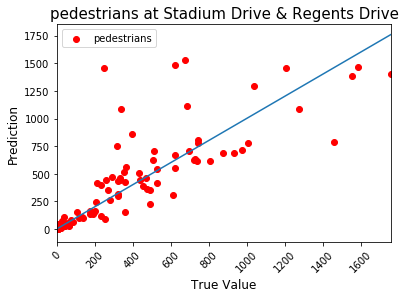

R2=0.7064247520345119


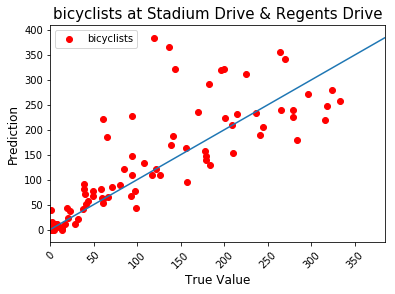

R2=0.9271476854355377


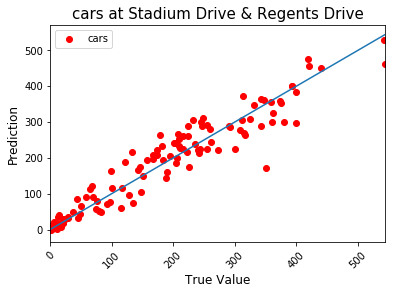

R2=0.8318165147531945


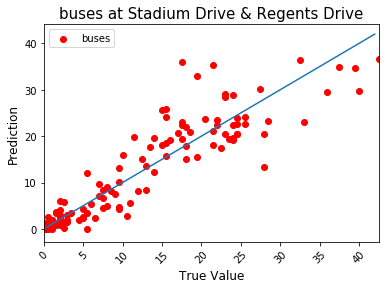

R2=0.8506134026535714


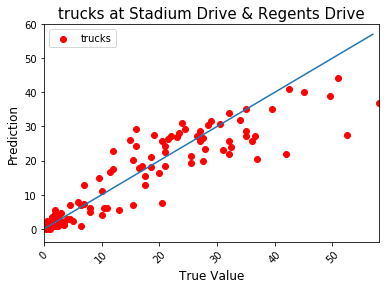

R2=0.5919641692894283


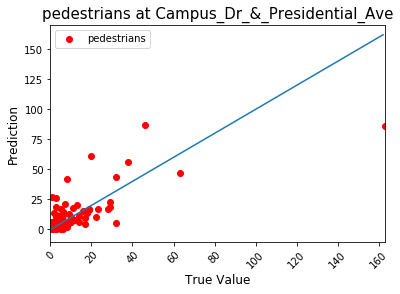

R2=0.1148650629179574


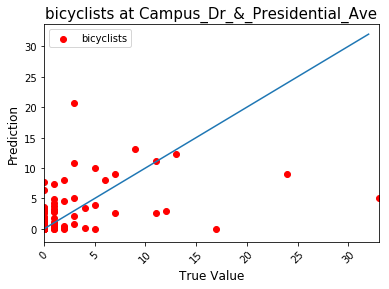

R2=0.873998198383424


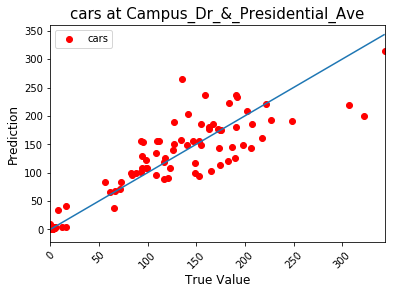

R2=0.6177293242970766


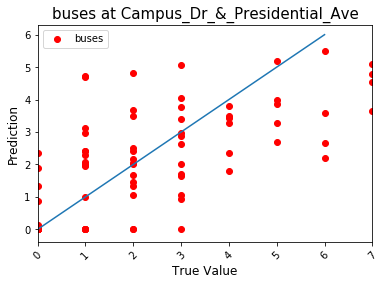

R2=0.4738364851621165


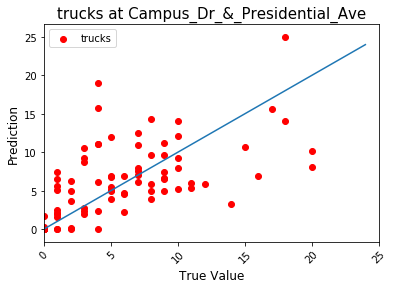

R2=-0.2406294933436075


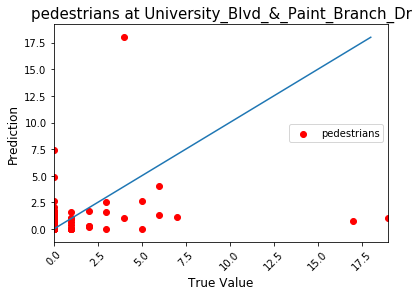

R2=0.26336211494860273


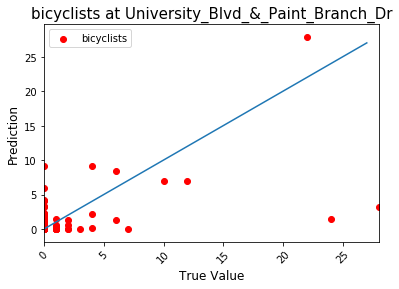

R2=0.8953663876110116


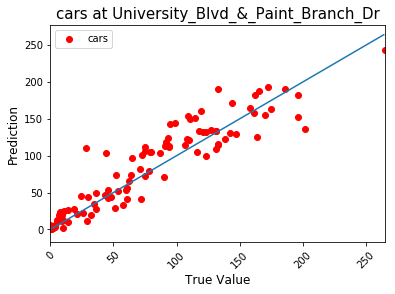

R2=0.3014258007055399


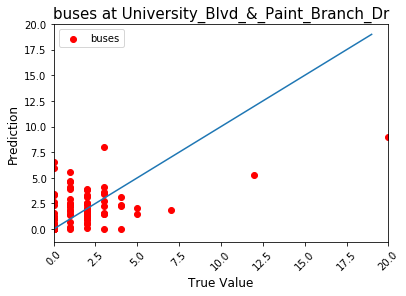

R2=0.6593084080105512


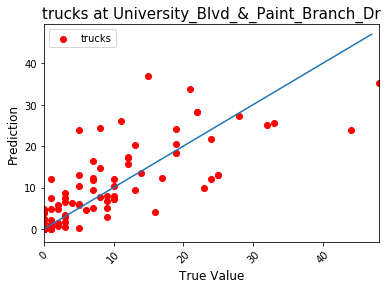

R2=0.7594817425265943


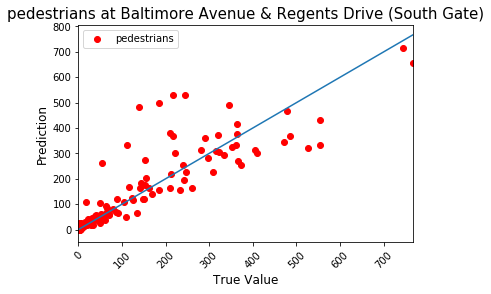

R2=0.423798038053548


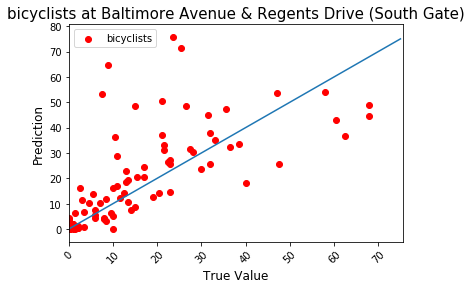

R2=0.9520514251796599


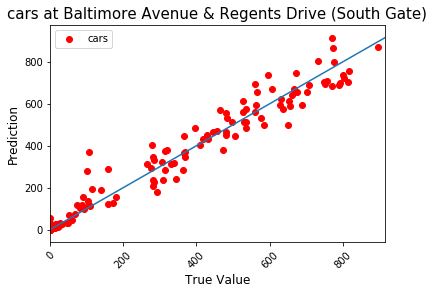

R2=0.6773307681464413


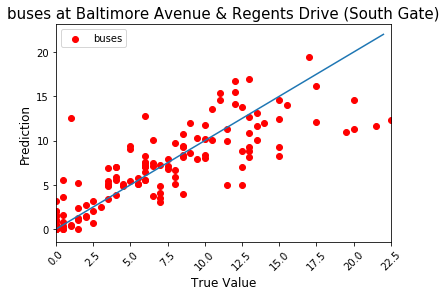

R2=0.8116959741383701


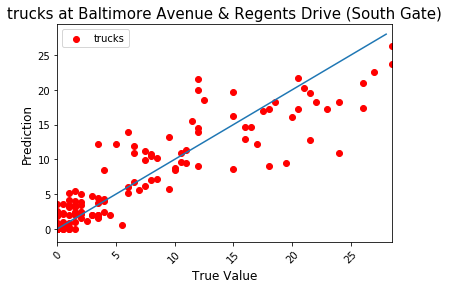

R2=0.43556951195059


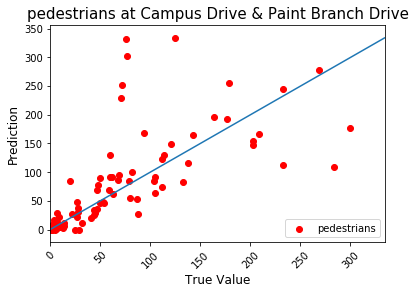

R2=0.15411336552650323


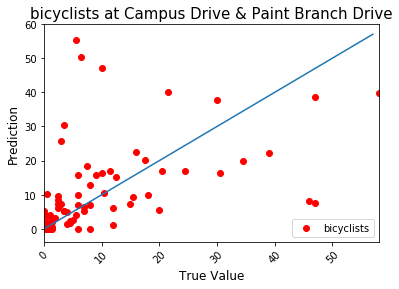

R2=0.897666044815238


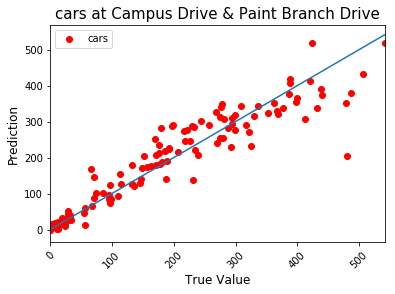

R2=0.8105337630945993


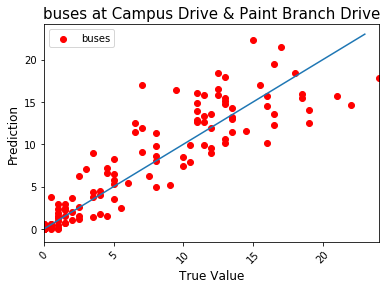

R2=0.6914117508148913


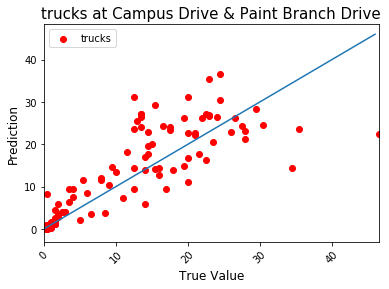

In [124]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import r2_score
from sklearn.ensemble import RandomForestRegressor

#Data Preprocessing
Dots_mod['FB_start']=Dots_mod['Date'].apply(lambda x: 12 if x.date()==datetime.date(2019,11,2) else -1)
Dots_mod['FB_end']=Dots_mod['Date'].apply(lambda x: 15 if x.date()==datetime.date(2019,11,2) else -1)
Dots_mod['hour']=Dots_mod['StartTime'].apply(lambda x: (int(x.hour)+float(x.minute/60)))
Dots_mod['temp']=Dots_mod['Date'].apply(lambda x: temperature(x))
Dots_mod['is_weekend']=Dots_mod['weekday'].apply(lambda x: 1 if x==6 or x==7 else -1)
Dots_mod['is_gameday']=Dots_mod['Date'].apply(lambda x: 1 if x.date()==datetime.date(2019,11,2) else -1)
Dots_mod['to_FB_start']=Dots_mod[['hour','FB_start']].apply(lambda x: x[0]-x[1],axis=1)
Dots_mod['to_FB_end']=Dots_mod[['hour','FB_end']].apply(lambda x: x[0]-x[1],axis=1)
Dots_mod['to_class_peak']=Dots_mod[['hour','weekday']].apply(to_class_peaks,axis=1)
Dots_mod['num_peaks']=Dots_mod['weekday'].apply(calculated_peak_number)


#Dots_mod['BK_start']=Dots_mod['Date'].apply(lambda x: 19.5 if x.date()==datetime.date(2019,11,1) or x.date()==datetime.date(2019,11,5) else (21 if x.date()==datetime.date(2019,11,9) else -1))
#Dots_mod['BK_end']=Dots_mod['Date'].apply(lambda x: 22.5 if x.date()==datetime.date(2019,11,1) or x.date()==datetime.date(2019,11,5) else (24 if x.date()==datetime.date(2019,11,9) else -1))

Dots_input=Dots_mod.copy()

locs=['Stadium Drive & Regents Drive','Campus_Dr_&_Presidential_Ave','University_Blvd_&_Paint_Branch_Dr',
                 'Baltimore Avenue & Regents Drive (South Gate)','Campus Drive & Paint Branch Drive']
types=['pedestrians','bicyclists','cars','buses','trucks']
#It is the ratio of testing sample.
ratio=0.10
Dots_list,train_idx_list,test_idx_list=generate_train_test_idx(Dots_input,locs,types,ratio)


#analysis about the time


for i in range(len(locs)):
    df=Dots_list[i]
    idx=range(df.shape[0])
    test_idx=test_idx_list[i]
    train_idx=train_idx_list[i]
    
    test_y_1_int=model_1_for_no_gamedays(df,train_idx,test_idx)
    test_y_1=pd.DataFrame(data=test_y_1_int, columns=['pedestrians','bicyclists','cars','buses','trucks'])
    test_1=df.iloc[test_idx,:]
    test_1=test_1[test_1["is_gameday"]==-1]
    test_y_1['time']=test_1.time.values
    
    
    test_y_2_in=model_2_for_gameday(df,train_idx,test_idx)
    test_2=df.iloc[test_idx,:]
    test_2=test_2[test_2["is_gameday"]==1]
    test_y_2=pd.DataFrame(data=test_y_2_in, columns=['pedestrians','bicyclists','cars','buses','trucks'])
    test_y_2['time']=test_2.time.values
    
    test_y=test_y_1.append(test_y_2)
    test_y=test_y.sort_values(by='time',ascending=True).reset_index(drop=True)
    
    
    
    true_y=df.iloc[test_idx,:][['time','pedestrians','bicyclists','cars','buses','trucks']]
    true_y=true_y.sort_values(by='time',ascending=True).reset_index(drop=True)
    
    
    for j in range(len(types)):
        acc=r2_score(true_y[types[j]], test_y.iloc[:,j])
        print ("R2="+ str(acc))
        lim=max(true_y[types[j]].max(),test_y.iloc[:,j].max())
        xx=np.arange(0,lim,1)
        fig = plt.figure()
        ax = plt.subplot(111)
        ax.set_xlim([0,lim])
        ax.set_xlim([0,lim])
        plt.figsize=(10,10)
        plt.plot(xx,xx)
        plt.scatter(true_y[types[j]],test_y.iloc[:,j],color='r')
        #ax.plot(x, test_y.iloc[:,j], label='Prediction',color='b')
        ax.legend()
        plt.xlabel('True Value', fontsize =12)
        plt.xticks(rotation=45)
        plt.ylabel('Prediction',fontsize =12)
        plt.title(types[j] + ' at '+locs[i], color = "k",fontsize =15)
        plt.show()

## Experiment 1: Change gameday schedule

In [115]:
def generate_train_test_idx_based_date(df_input,locs,types,testdate):
    Dots_list=[]
    train_idx_list=[]
    test_idx_list=[]
    for i in locs:
        Dots_list.append(df_input[df_input["location_5"]==i])
    
    for i in range(len(locs)):
        df=Dots_list[i]
        df.reset_index(drop=True, inplace=True)
        test_idx=df[df['Date']==testdate].index.values
        train_idx=df[df['Date']!=testdate].index.values
        
        train_idx_list.append(train_idx)
        test_idx_list.append(test_idx)
    return Dots_list,train_idx_list,test_idx_list

R2=0.10768075083649442


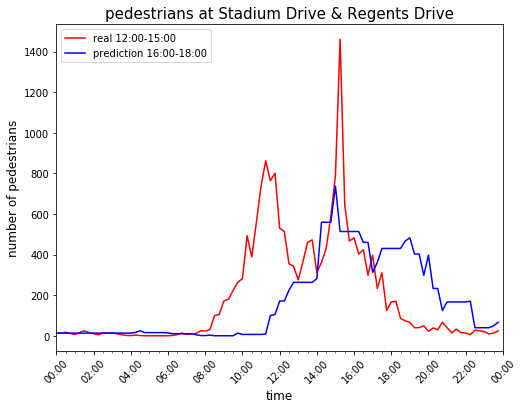

R2=-0.7142695871966414


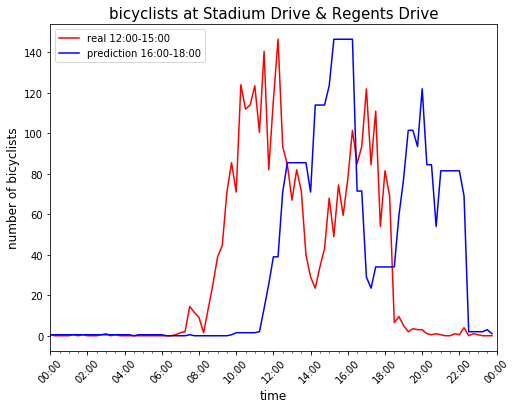

R2=-0.4904090204510656


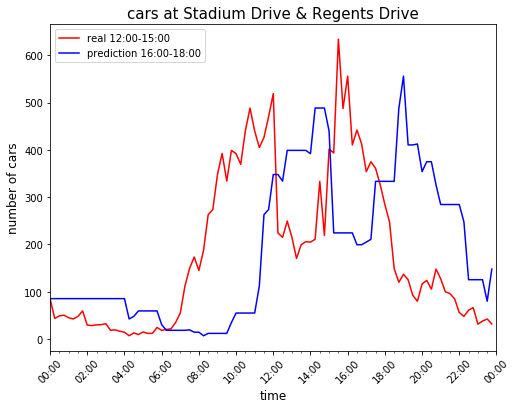

R2=-0.42184843244941095


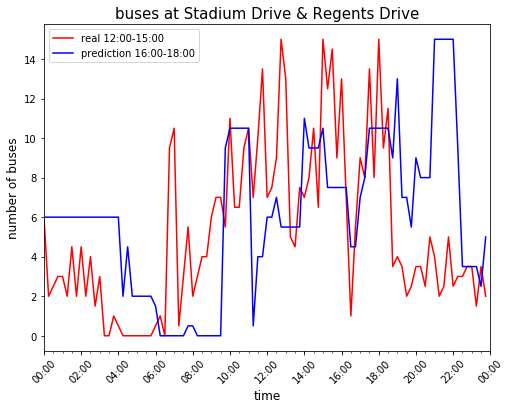

R2=-0.38609662038819126


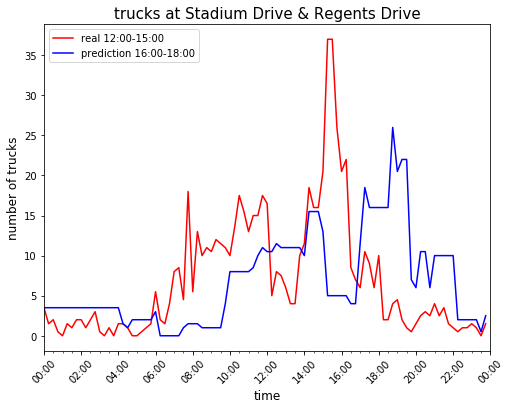

R2=-0.6513516787313356


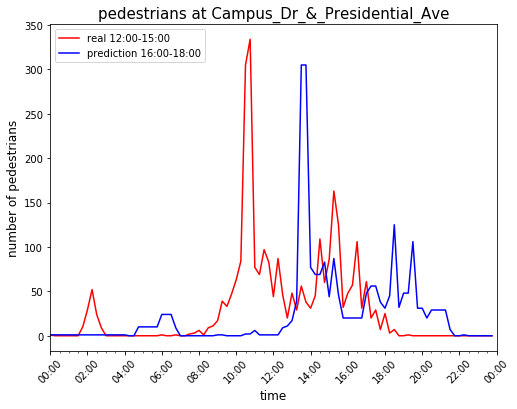

R2=-0.5701748905351072


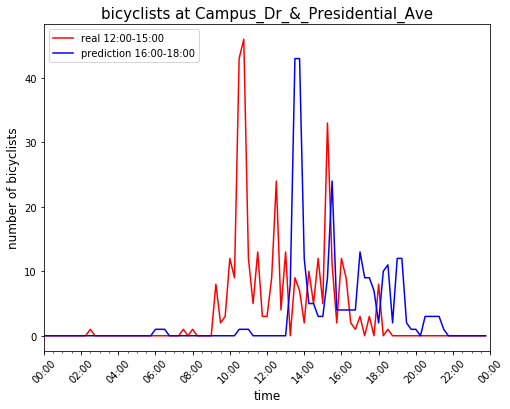

R2=-0.23991958705071736


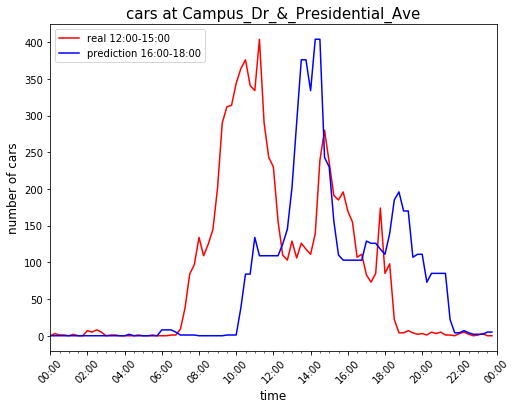

R2=-1.683512318382817


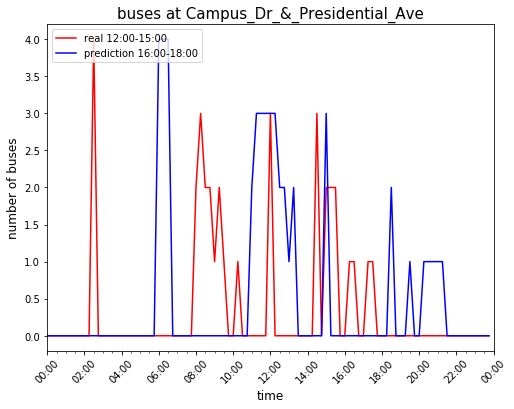

R2=0.1148544872620616


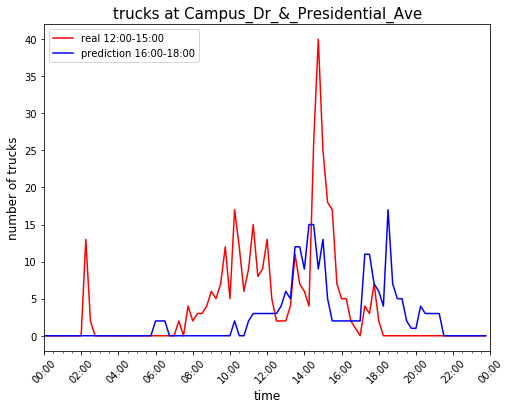

R2=-0.6407786140669609


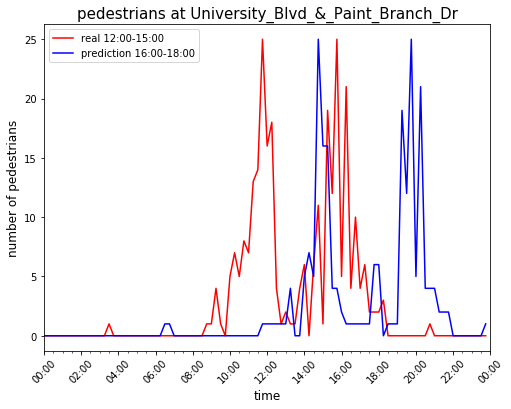

R2=0.012444235736088327


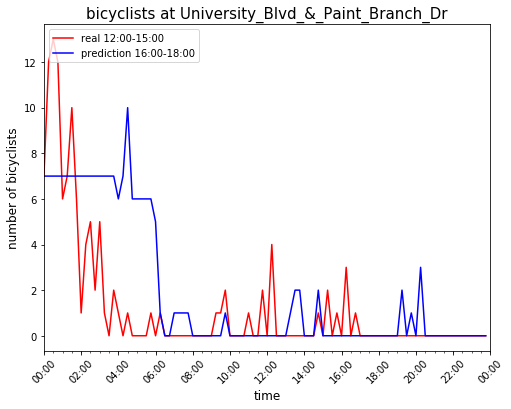

R2=-0.5616697077463273


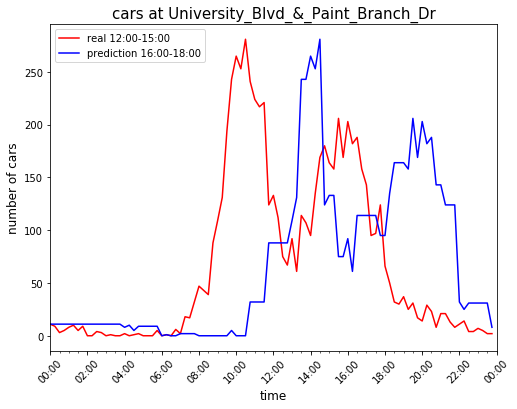

R2=-0.7355772764018522


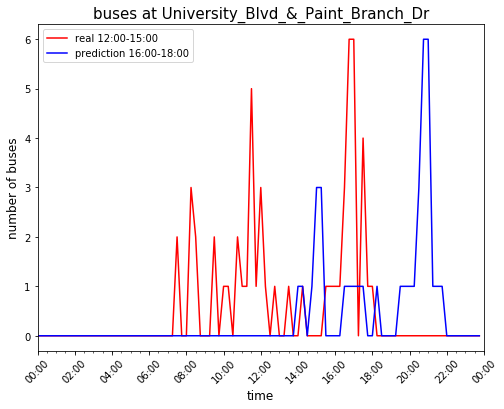

R2=-1.105080304216946


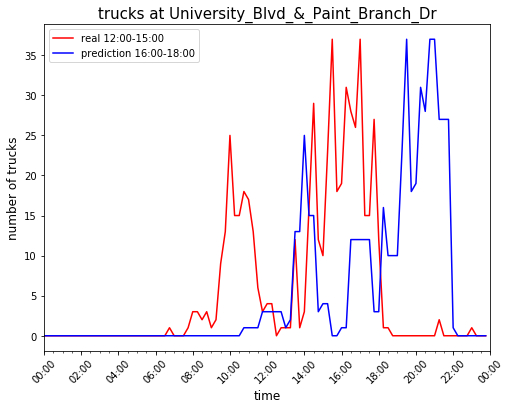

R2=-0.49184469963737


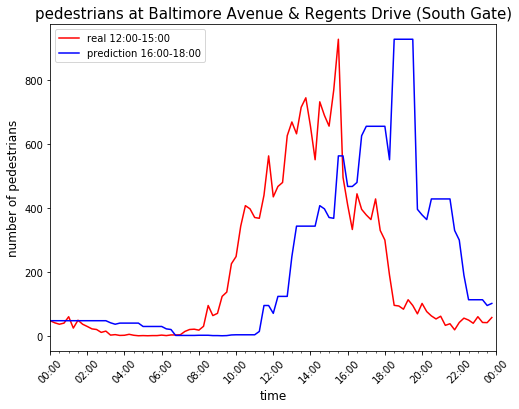

R2=-0.41067834030102857


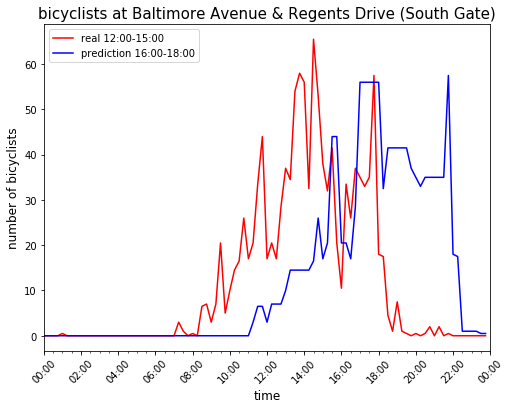

R2=-0.11108597626765615


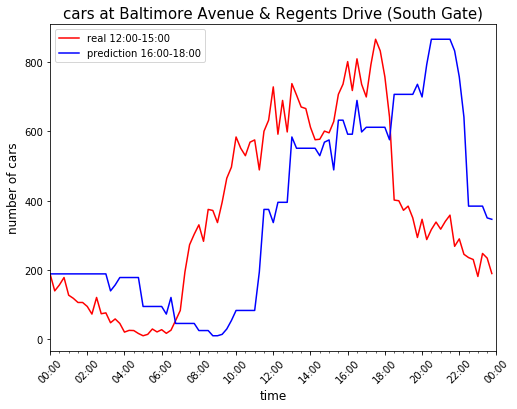

R2=-1.4715427516509303


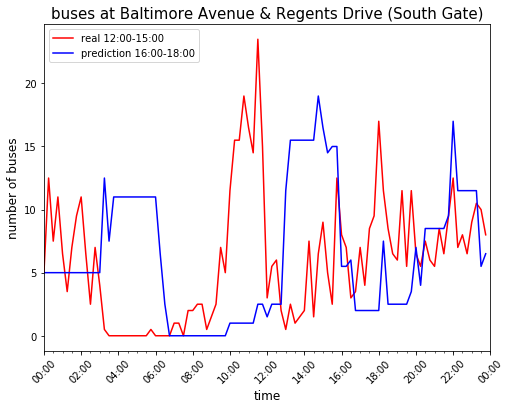

R2=-0.4478292459485924


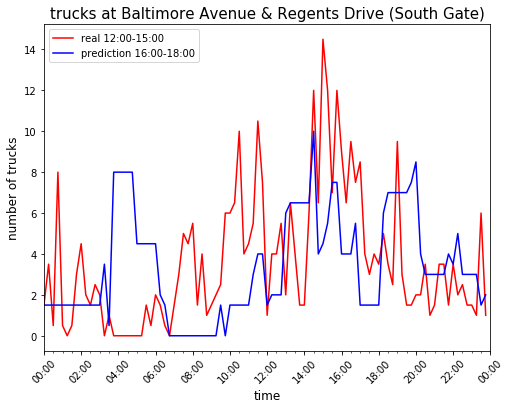

R2=-0.6272911255866003


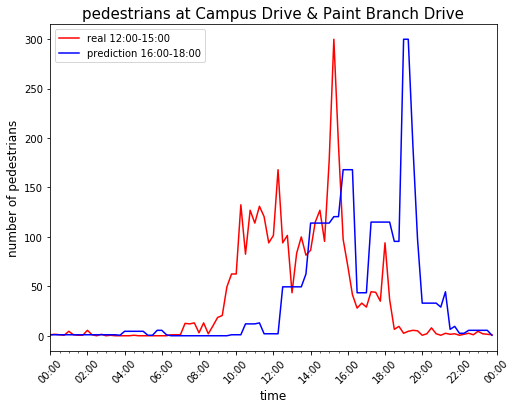

R2=-0.8291435436809891


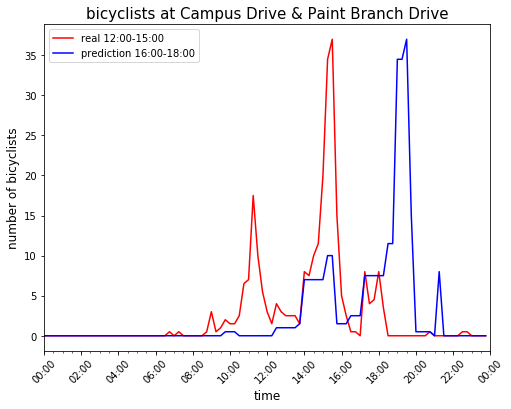

R2=-0.3029504109476304


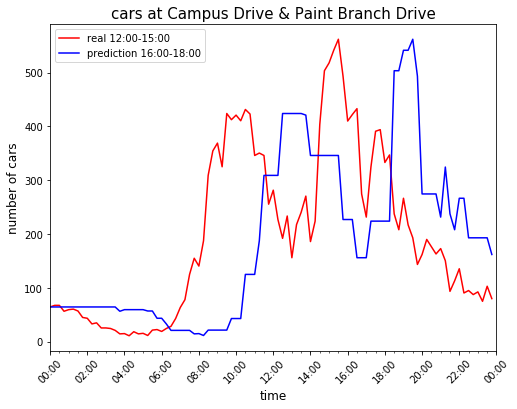

R2=-0.11521947743591476


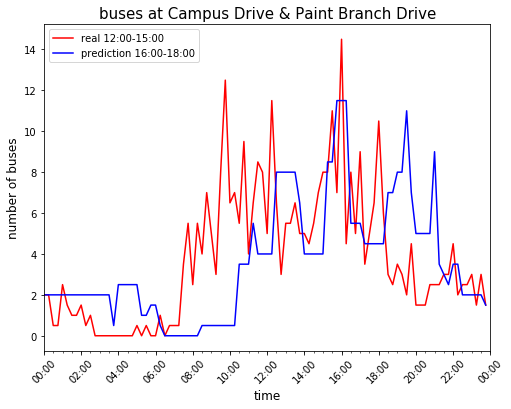

R2=-0.47788837646682203


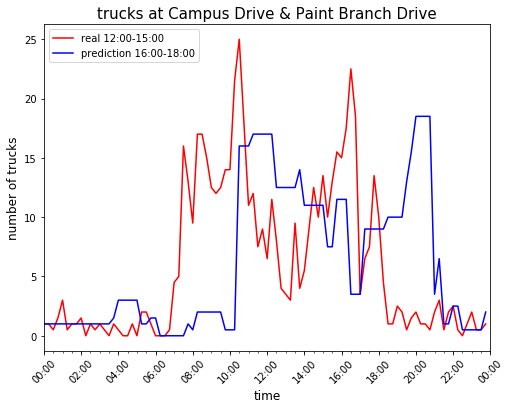

In [116]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import r2_score
from sklearn.ensemble import RandomForestRegressor

#Data Preprocessing
Dots_test=Dots_mod[Dots_mod['Date']=='2019-11-02'].copy()
Dots_mod['FB_start']=Dots_mod['Date'].apply(lambda x: 12 if x.date()==datetime.date(2019,11,2) else -1)
Dots_mod['FB_end']=Dots_mod['Date'].apply(lambda x: 15 if x.date()==datetime.date(2019,11,2) else -1)
Dots_mod['hour']=Dots_mod['StartTime'].apply(lambda x: (int(x.hour)+float(x.minute/60)))
Dots_mod['temp']=Dots_mod['Date'].apply(lambda x: temperature(x))
Dots_mod['is_weekend']=Dots_mod['weekday'].apply(lambda x: 1 if x==6 or x==7 else -1)
Dots_mod['is_gameday']=Dots_mod['Date'].apply(lambda x: 1 if x.date()==datetime.date(2019,11,2) else -1)
Dots_mod['to_FB_start']=Dots_mod[['hour','FB_start']].apply(lambda x: x[0]-x[1],axis=1)
Dots_mod['to_FB_end']=Dots_mod[['hour','FB_end']].apply(lambda x: x[0]-x[1],axis=1)
Dots_mod['to_class_peak']=Dots_mod[['hour','weekday']].apply(to_class_peaks,axis=1)
Dots_mod['num_peaks']=Dots_mod['weekday'].apply(calculated_peak_number)

## You can revise game time here
Dots_test['Date']='2019-11-16'
Dots_test['FB_start']=16
Dots_test['FB_end']=18
Dots_test['hour']=Dots_test['StartTime'].apply(lambda x: (int(x.hour)+float(x.minute/60)))
Dots_test['temp']=38.9
Dots_test['is_weekend']=1
Dots_test['is_gameday']=1
Dots_test['to_FB_start']=Dots_test[['hour','FB_start']].apply(lambda x: x[0]-x[1],axis=1)
Dots_test['to_FB_end']=Dots_test[['hour','FB_end']].apply(lambda x: x[0]-x[1],axis=1)
Dots_test['to_class_peak']=Dots_test[['hour','weekday']].apply(to_class_peaks,axis=1)
Dots_test['num_peaks']=Dots_test['weekday'].apply(calculated_peak_number)

Dots_input=Dots_mod.append(Dots_test,ignore_index=True)



locs=['Stadium Drive & Regents Drive','Campus_Dr_&_Presidential_Ave','University_Blvd_&_Paint_Branch_Dr',
                 'Baltimore Avenue & Regents Drive (South Gate)','Campus Drive & Paint Branch Drive']
types=['pedestrians','bicyclists','cars','buses','trucks']

Dots_list, train_idx_list,test_idx_list=generate_train_test_idx_based_date(Dots_input,locs,types,'2019-11-16')

#analysis about the time
for i in range(len(locs)):
    df=Dots_list[i]
    idx=range(df.shape[0])
    test_idx=test_idx_list[i]
    #test_idx=idx
    train_idx=train_idx_list[i]
    
    test_1=df.iloc[test_idx,:]
    test_1=test_1[test_1["is_gameday"]==-1]
    if test_1.shape[0]!=0:
        test_y_1_int=model_1_for_no_gamedays(df,train_idx,test_idx)
        test_y_1=pd.DataFrame(data=test_y_1_int, columns=['pedestrians','bicyclists','cars','buses','trucks'])
        test_y_1['time']=test_1.time.values
    
    test_2=df.iloc[test_idx,:]
    test_2=test_2[test_2["is_gameday"]==1]
    if test_2.shape[0]!=0:
        test_y_2_in=model_2_for_gameday(df,train_idx,test_idx)
        test_y_2=pd.DataFrame(data=test_y_2_in, columns=['pedestrians','bicyclists','cars','buses','trucks'])
        test_y_2['time']=test_2.time.values
    
    if test_2.shape[0]==0:
        test_y=test_y_1
    elif test_1.shape[0]==0:
        test_y=test_y_2
    else:
        test_y=test_y_1.append(test_y_2)
        
    test_y=test_y.sort_values(by='time',ascending=True)
    
    
    
    true_y=df.iloc[test_idx,:][['pedestrians','bicyclists','cars','buses','trucks']]
    x=df.iloc[test_idx,:].time
    
    
    
    
    for j in range(len(types)):
        acc=r2_score(true_y[types[j]], test_y.iloc[:,j])
        print ("R2="+ str(acc))
        fig = plt.figure(figsize=(8,6))
        ax = plt.subplot(111)
        start_time=x.values[0]
        end_time=x.values[-1]+np.timedelta64(15,'m')
        ax.plot(x, true_y[types[j]], label='real 12:00-15:00',color='r')
        ax.plot(x, test_y.iloc[:,j], label='prediction 16:00-18:00',color='b')
        ax.set_xlim([start_time,end_time])
        ax.xaxis.set_major_locator(md.MinuteLocator(interval=120))  
        ax.xaxis.set_minor_locator(md.MinuteLocator(interval=30))
        ax.xaxis.set_major_formatter(md.DateFormatter('%H:%M'))
        ax.legend(loc='upper left')
        
        plt.xlabel('time', fontsize =12)
        plt.xticks(rotation=45)
        plt.ylabel('number of '+ types[j],fontsize =12)
        plt.title(types[j] + ' at '+locs[i], color = "k",fontsize =15)
        plt.show()
    
    




## Experiment 2: Change class schedule

In [117]:
def to_class_peaks_2(a):
    ##Please enter the class schedule
    class_schedule={1:np.arange(7.75,18.75,0.75),
                   2:np.arange(7.75,19,1.5),
                   3:np.arange(7.75,18.75,1.0),
                   4:np.arange(7.75,19,1.5),
                   5:np.arange(7.75,18.75,1.0)}
    if a[1] in class_schedule:
        dif_min=np.amin(a[0]-class_schedule[a[1]])
        return dif_min
        
    return -1
    

In [118]:
def calculated_peak_number_2(a):
    class_schedule={1:np.arange(7.75,18.75,0.5),
                   2:np.arange(7.75,19,1.5),
                   3:np.arange(7.75,18.75,1.0),
                   4:np.arange(7.75,19,1.5),
                   5:np.arange(7.75,18.75,1.0)}
    
    if a in class_schedule:
        return class_schedule[a].size
        
    else:
        return 0

R2=0.7474695633414421


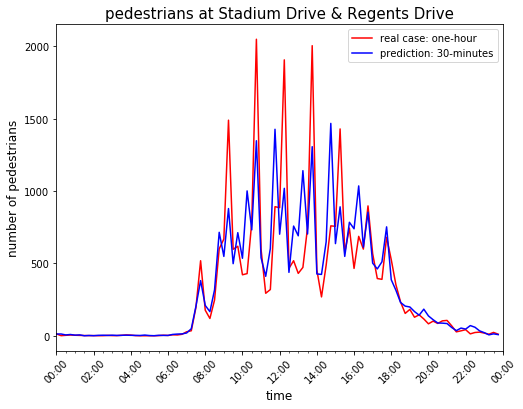

R2=0.7419232676281511


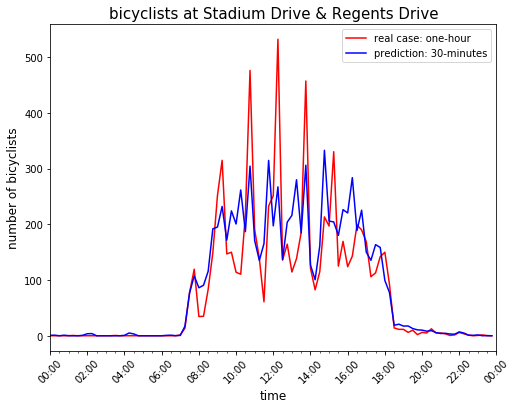

R2=0.9590142497352429


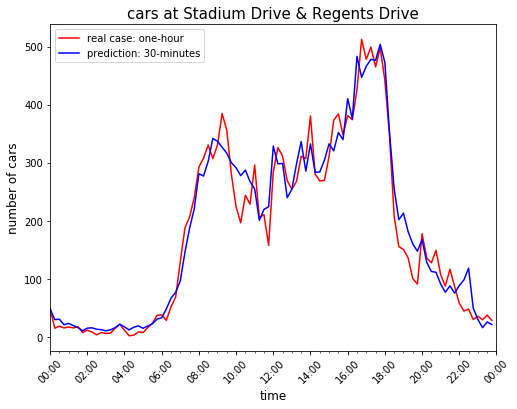

R2=0.8968433754689488


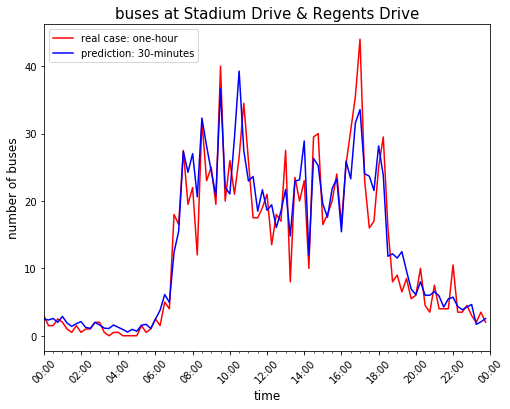

R2=0.9146493904910223


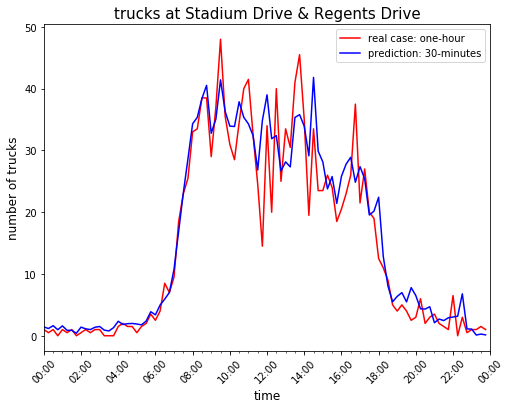

R2=0.5843857090745206


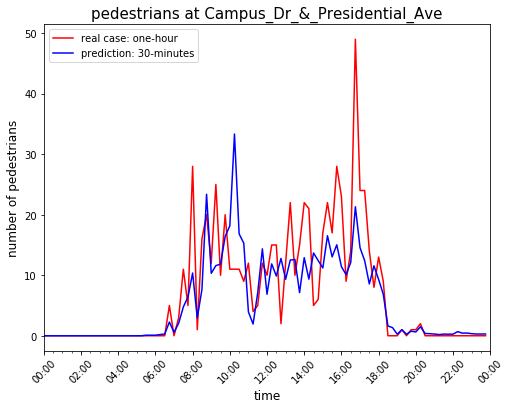

R2=0.4842254902547014


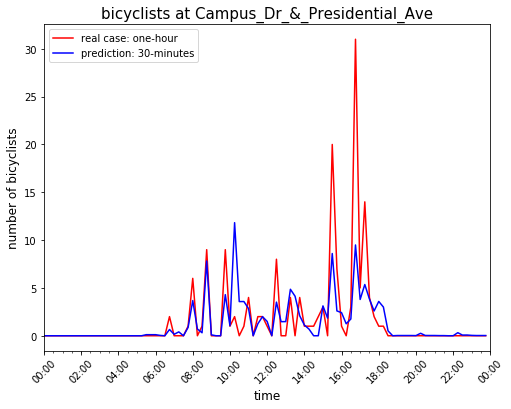

R2=0.9052539705363668


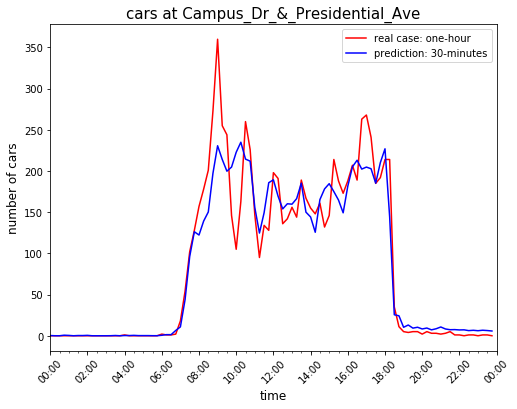

R2=0.8182034533442195


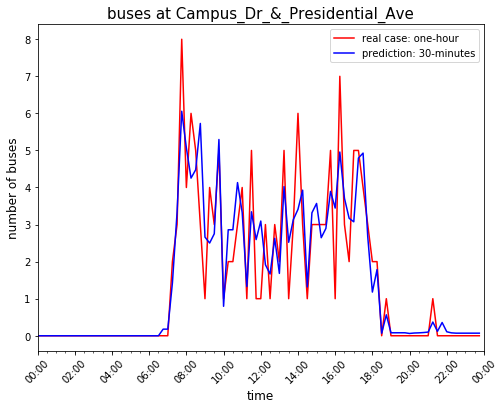

R2=0.7592149285388047


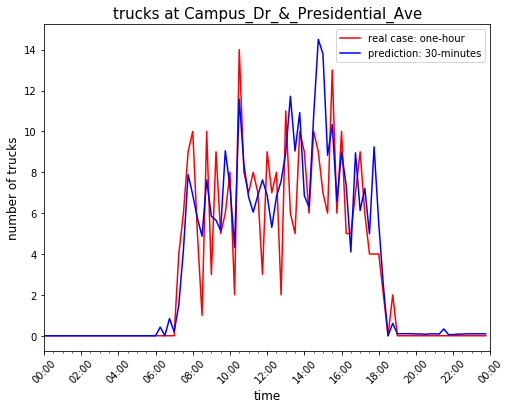

R2=-0.05494906410892475


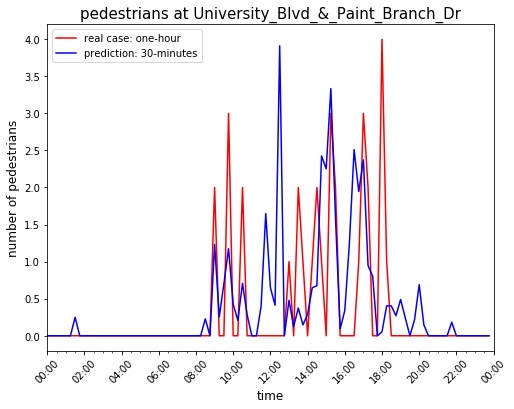

R2=-0.6975362871966526


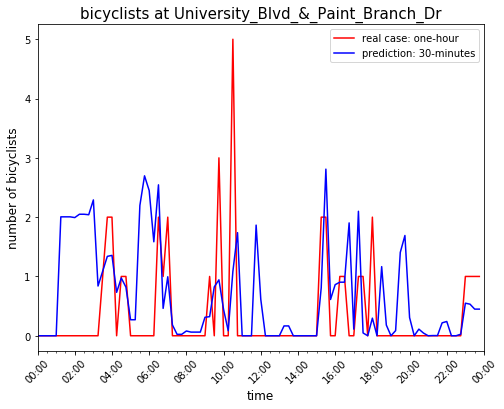

R2=0.9211106975709799


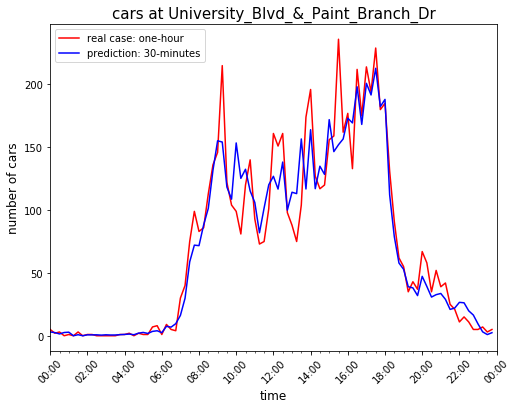

R2=0.38576930202762916


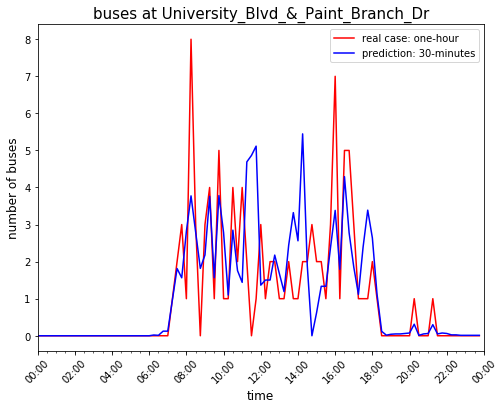

R2=0.8799283524158833


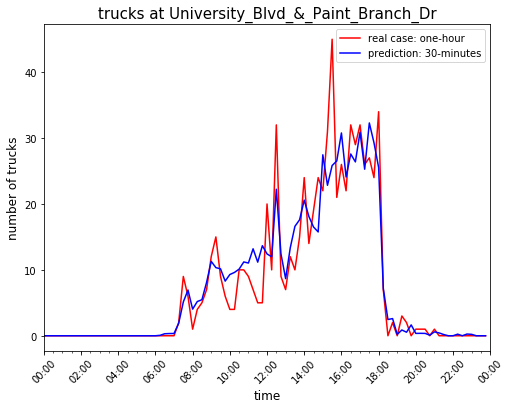

R2=0.7854574972510586


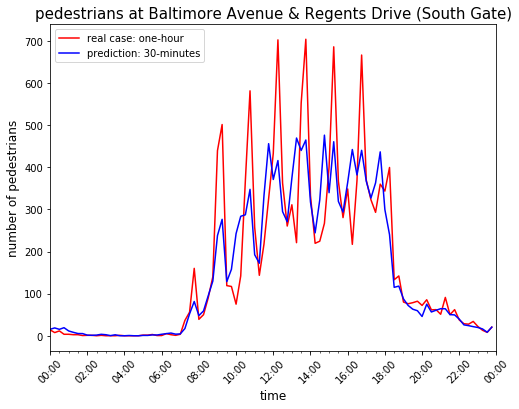

R2=0.8468415433561995


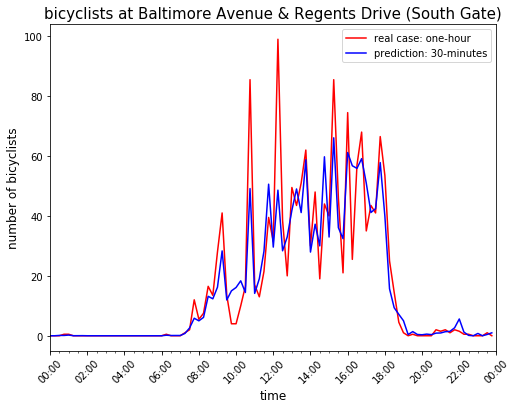

R2=0.9657846302959815


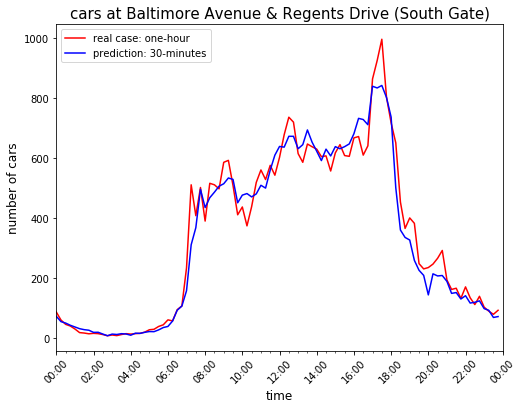

R2=0.7837873879930148


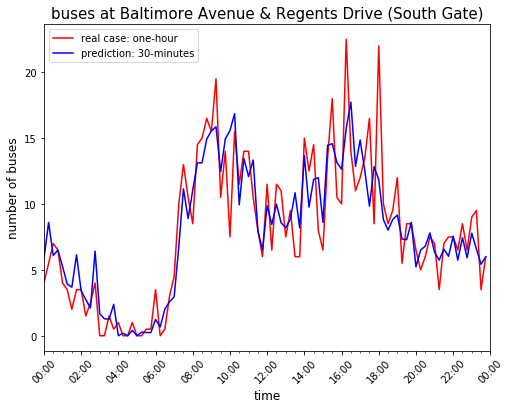

R2=0.8717842434777268


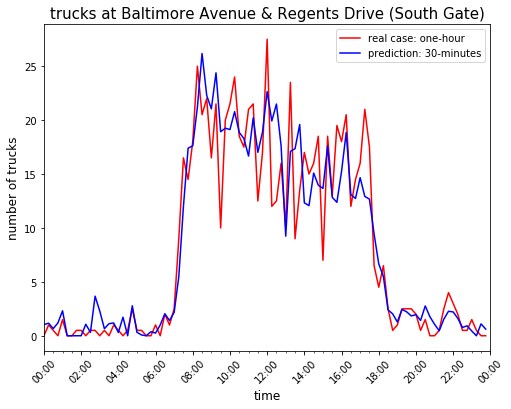

R2=0.7044844784994818


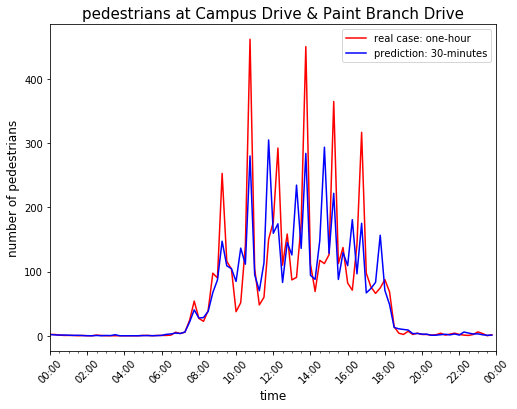

R2=0.6066154536884745


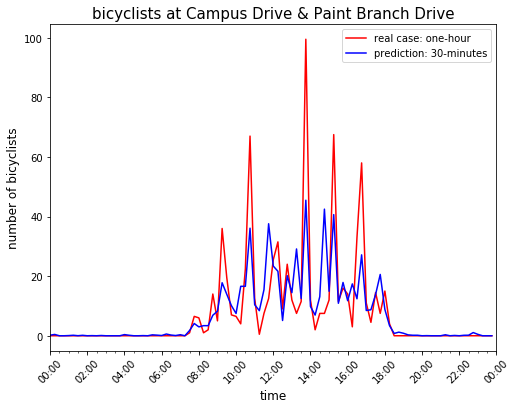

R2=0.9313461383285715


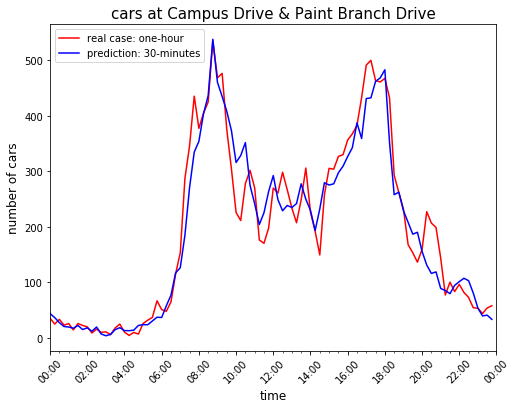

R2=0.9297804512494725


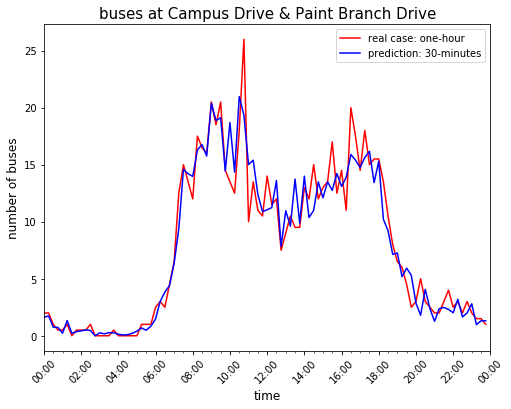

R2=0.9057264984869438


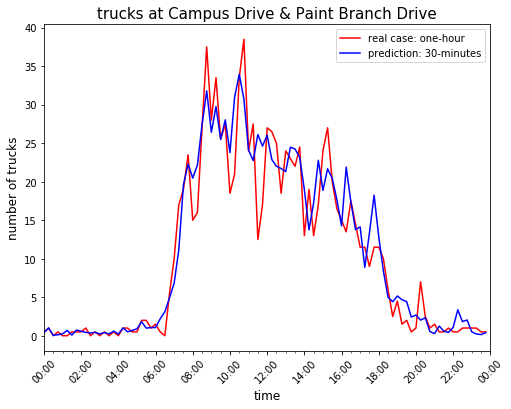

In [119]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import r2_score
from sklearn.ensemble import RandomForestRegressor

#Data Preprocessing
Dots_test=Dots_mod[Dots_mod['Date']=='2019-10-29'].copy()
Dots_mod['FB_start']=Dots_mod['Date'].apply(lambda x: 12 if x.date()==datetime.date(2019,11,2) else -1)
Dots_mod['FB_end']=Dots_mod['Date'].apply(lambda x: 15 if x.date()==datetime.date(2019,11,2) else -1)
Dots_mod['hour']=Dots_mod['StartTime'].apply(lambda x: (int(x.hour)+float(x.minute/60)))
Dots_mod['temp']=Dots_mod['Date'].apply(lambda x: temperature(x))
Dots_mod['is_weekend']=Dots_mod['weekday'].apply(lambda x: 1 if x==6 or x==7 else -1)
Dots_mod['is_gameday']=Dots_mod['Date'].apply(lambda x: 1 if x.date()==datetime.date(2019,11,2) else -1)
Dots_mod['to_FB_start']=Dots_mod[['hour','FB_start']].apply(lambda x: x[0]-x[1],axis=1)
Dots_mod['to_FB_end']=Dots_mod[['hour','FB_end']].apply(lambda x: x[0]-x[1],axis=1)
Dots_mod['to_class_peak']=Dots_mod[['hour','weekday']].apply(to_class_peaks,axis=1)
Dots_mod['num_peaks']=Dots_mod['weekday'].apply(calculated_peak_number)

## You can revise game time here
Dots_test['Date']='2019-10-22'
Dots_test['FB_start']=-1
Dots_test['FB_end']=-1
Dots_test['hour']=Dots_test['StartTime'].apply(lambda x: (int(x.hour)+float(x.minute/60)))
Dots_test['temp']=58
Dots_test['is_weekend']=-1
Dots_test['is_gameday']=-1
Dots_test['to_FB_start']=Dots_test[['hour','FB_start']].apply(lambda x: x[0]-x[1],axis=1)
Dots_test['to_FB_end']=Dots_test[['hour','FB_end']].apply(lambda x: x[0]-x[1],axis=1)
Dots_test['to_class_peak']=Dots_test[['hour','weekday']].apply(to_class_peaks_2,axis=1)
Dots_test['num_peaks']=Dots_test['weekday'].apply(calculated_peak_number_2)

Dots_input=Dots_mod.append(Dots_test,ignore_index=True)



locs=['Stadium Drive & Regents Drive','Campus_Dr_&_Presidential_Ave','University_Blvd_&_Paint_Branch_Dr',
                 'Baltimore Avenue & Regents Drive (South Gate)','Campus Drive & Paint Branch Drive']
types=['pedestrians','bicyclists','cars','buses','trucks']

Dots_list, train_idx_list,test_idx_list=generate_train_test_idx_based_date(Dots_input,locs,types,'2019-10-22')

#analysis about the time
for i in range(len(locs)):
    df=Dots_list[i]
    idx=range(df.shape[0])
    test_idx=test_idx_list[i]
    #test_idx=idx
    train_idx=train_idx_list[i]
    
    test_1=df.iloc[test_idx,:]
    test_1=test_1[test_1["is_gameday"]==-1]
    if test_1.shape[0]!=0:
        test_y_1_int=model_1_for_no_gamedays(df,train_idx,test_idx)
        test_y_1=pd.DataFrame(data=test_y_1_int, columns=['pedestrians','bicyclists','cars','buses','trucks'])
        test_y_1['time']=test_1.time.values
    
    test_2=df.iloc[test_idx,:]
    test_2=test_2[test_2["is_gameday"]==1]
    if test_2.shape[0]!=0:
        test_y_2_in=model_2_for_gameday(df,train_idx,test_idx)
        test_y_2=pd.DataFrame(data=test_y_2_in, columns=['pedestrians','bicyclists','cars','buses','trucks'])
        test_y_2['time']=test_2.time.values
    
    if test_2.shape[0]==0:
        test_y=test_y_1
    elif test_1.shape[0]==0:
        test_y=test_y_2
    else:
        test_y=test_y_1.append(test_y_2)
        
    test_y=test_y.sort_values(by='time',ascending=True)
    
    
    
    true_y=df.iloc[test_idx,:][['pedestrians','bicyclists','cars','buses','trucks']]
    x=df.iloc[test_idx,:].time
    
    
    
    
    for j in range(len(types)):
        acc=r2_score(true_y[types[j]], test_y.iloc[:,j])
        print ("R2="+ str(acc))
        fig = plt.figure(figsize=(8,6))
        ax = plt.subplot(111)
        start_time=x.values[0]
        end_time=x.values[-1]+np.timedelta64(15,'m')
        ax.plot(x, true_y[types[j]], label='real case: one-hour',color='r')
        ax.plot(x, test_y.iloc[:,j], label='prediction: 30-minutes',color='b')
        ax.set_xlim([start_time,end_time])
        ax.xaxis.set_major_locator(md.MinuteLocator(interval=120))  
        ax.xaxis.set_minor_locator(md.MinuteLocator(interval=30))  
        ax.xaxis.set_major_formatter(md.DateFormatter('%H:%M'))
        ax.legend()
        plt.xlabel('time', fontsize =12)
        plt.xticks(rotation=45)
        plt.ylabel('number of '+ types[j],fontsize =12)
        plt.title(types[j] + ' at '+locs[i], color = "k",fontsize =15)
        plt.show()
    

## Experiment 3: Population


R2=0.7757994469246747


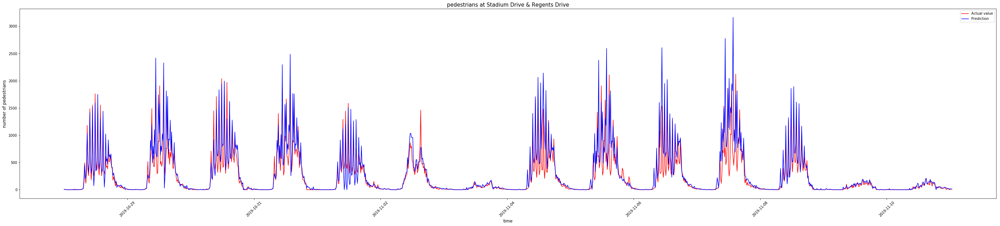

R2=0.8452139609214403


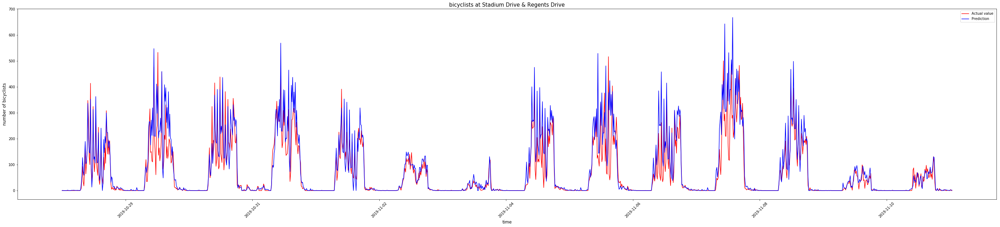

R2=0.9393426715408222


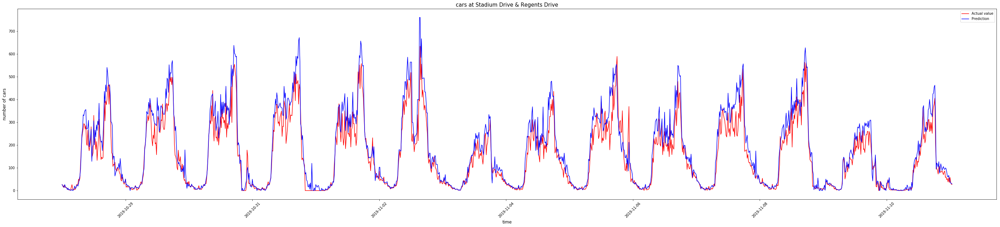

R2=0.8839277192773471


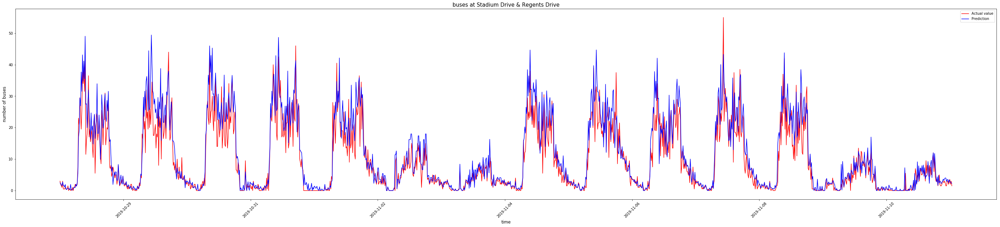

R2=0.9011758287123733


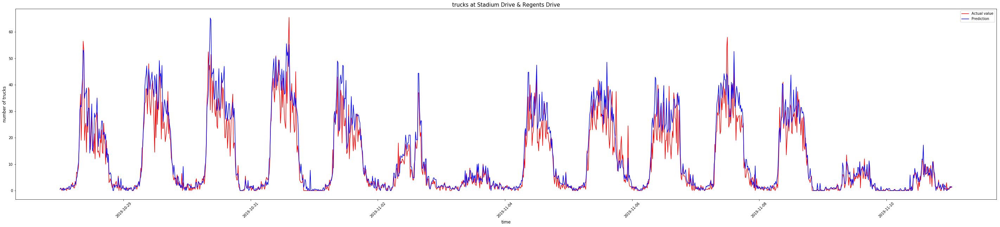

R2=0.8706425398050057


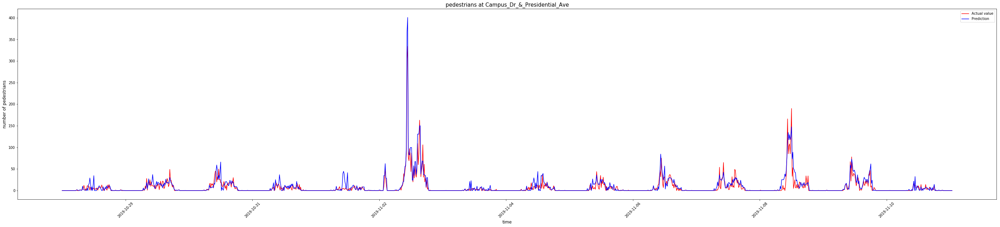

R2=0.575553090892549


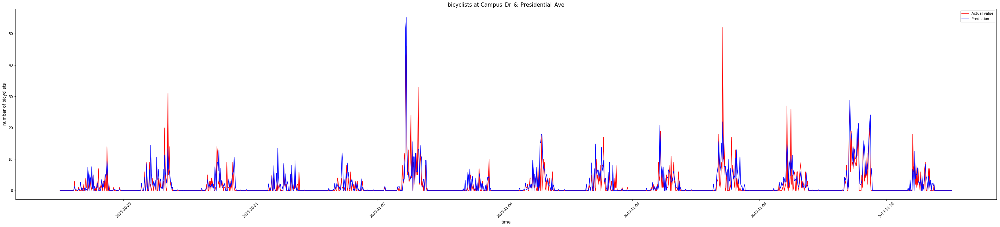

R2=0.9156172492560082


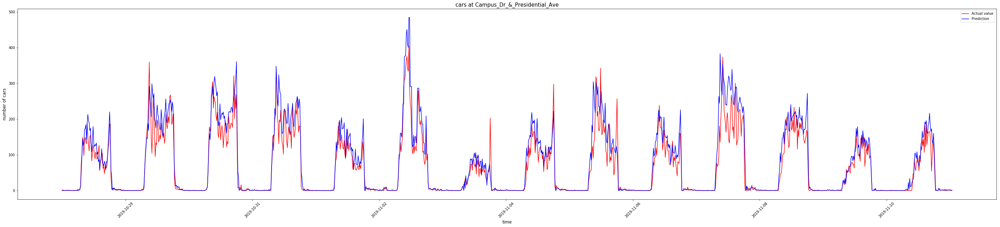

R2=0.7143758501097099


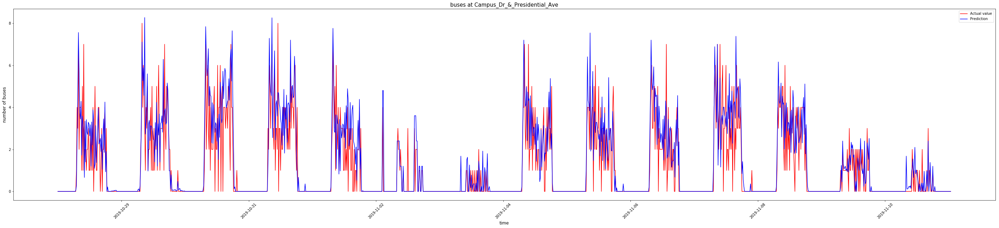

R2=0.7525810159293771


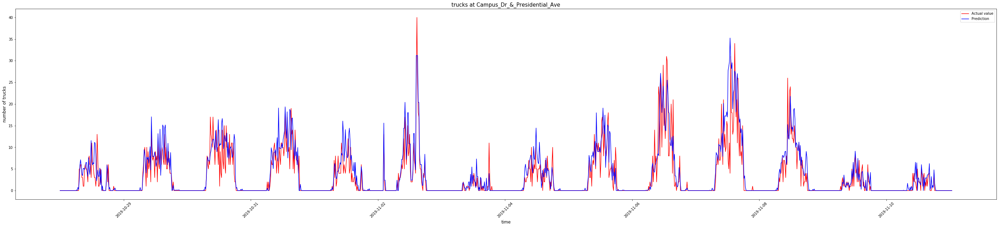

R2=0.6283851427721068


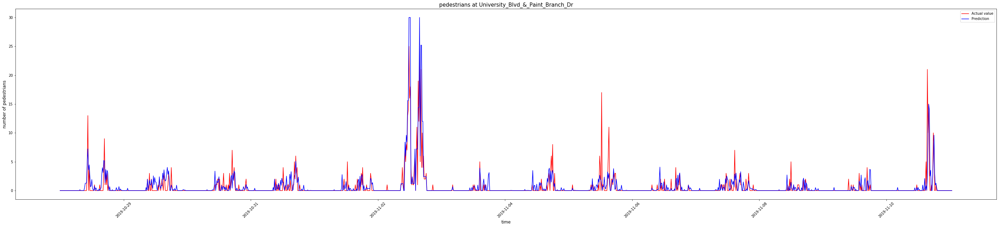

R2=0.6908973011192774


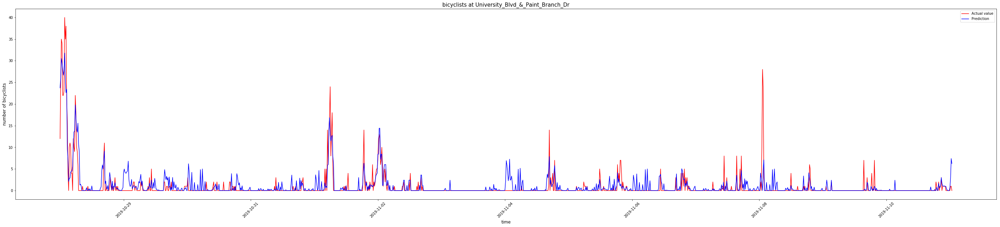

R2=0.9296744632577087


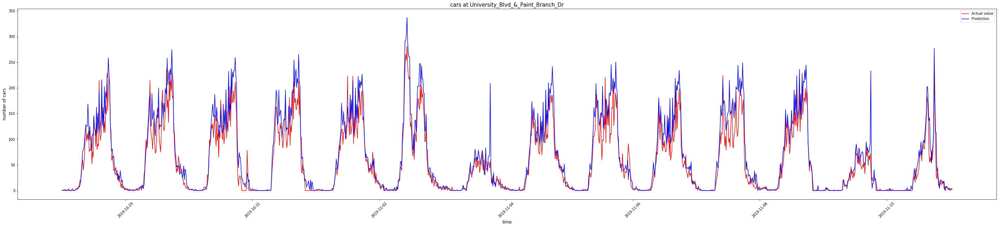

R2=0.5957483339770662


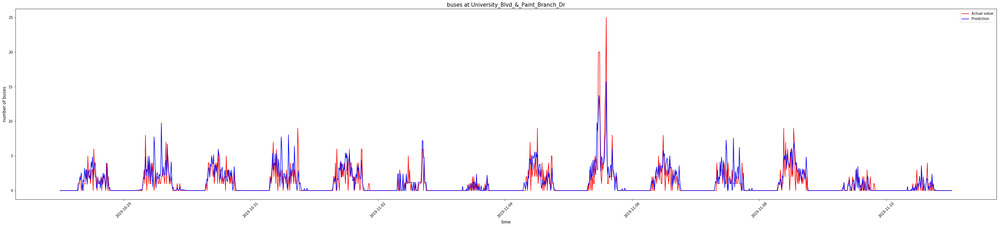

R2=0.837234929990856


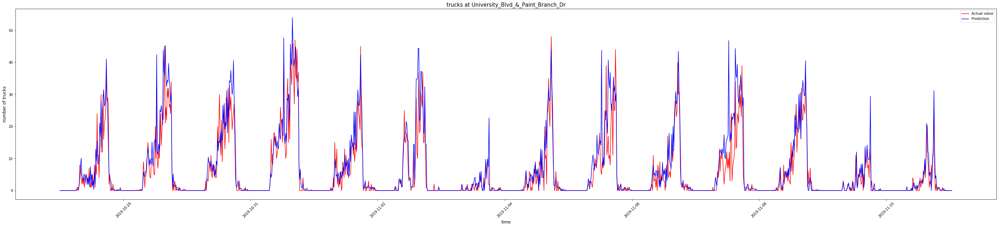

R2=0.8470826928545454


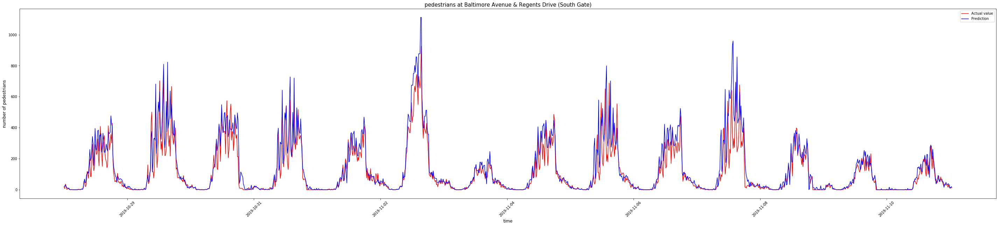

R2=0.7641586725979815


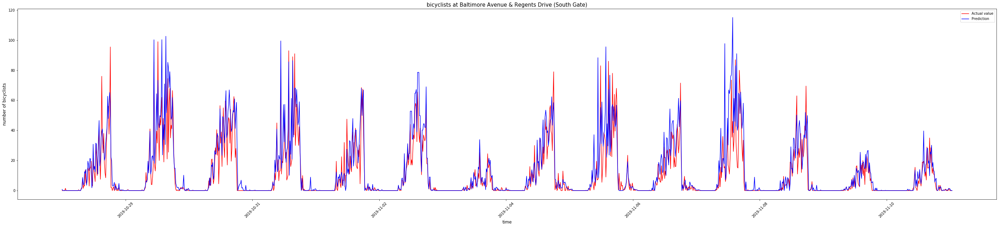

R2=0.9629413219343692


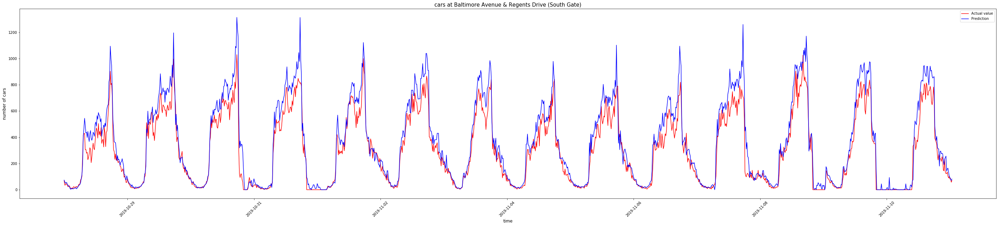

R2=0.7828059956250114


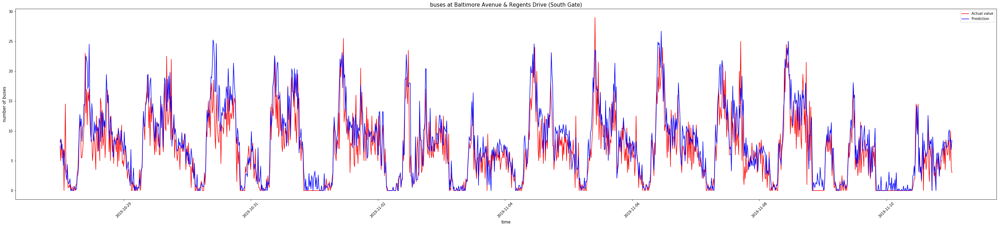

R2=0.8238344695585624


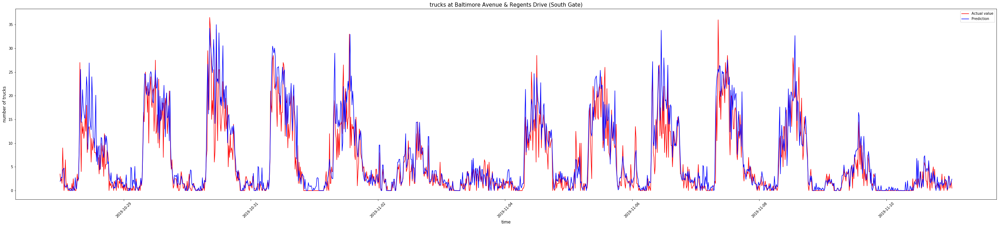

R2=0.6889154790816341


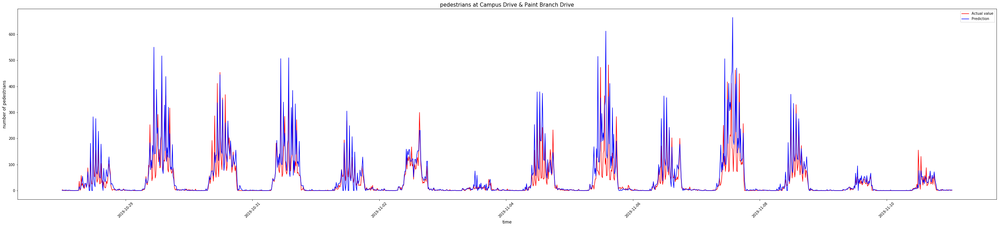

R2=0.5596886614421822


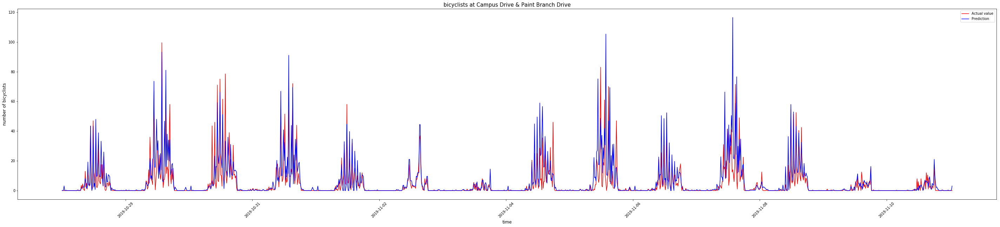

R2=0.9350689682886214


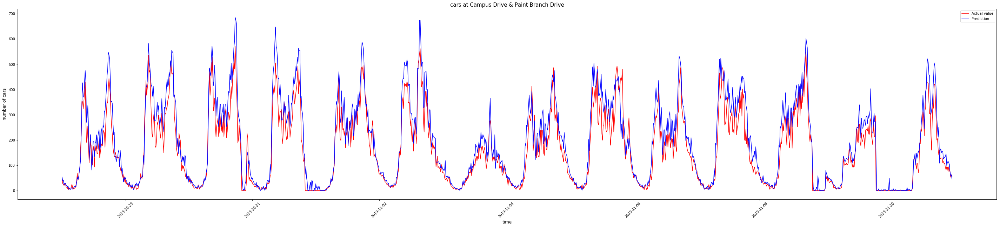

R2=0.9035461456439549


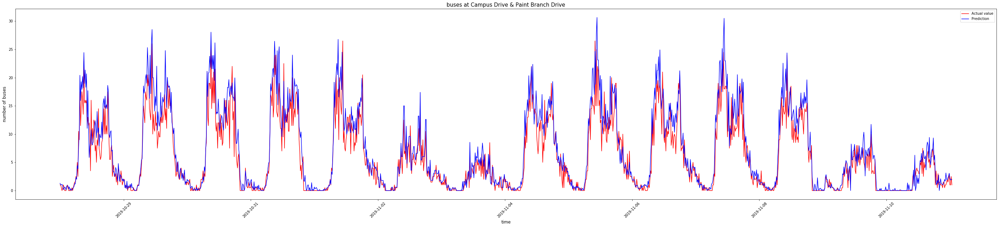

R2=0.8735882619294115


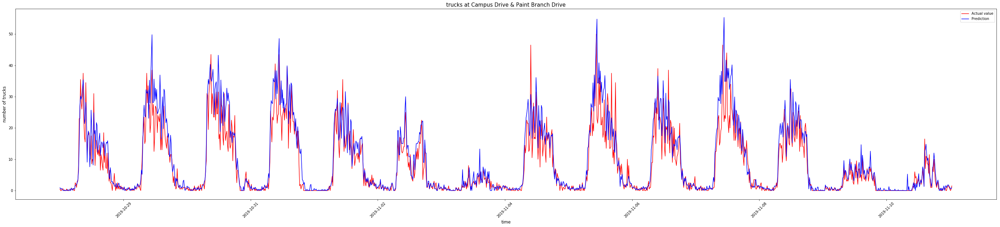

In [120]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import r2_score
from sklearn.ensemble import RandomForestRegressor

#Data Preprocessing
Dots_mod['FB_start']=Dots_mod['Date'].apply(lambda x: 12 if x.date()==datetime.date(2019,11,2) else -1)
Dots_mod['FB_end']=Dots_mod['Date'].apply(lambda x: 15 if x.date()==datetime.date(2019,11,2) else -1)
Dots_mod['hour']=Dots_mod['StartTime'].apply(lambda x: (int(x.hour)+float(x.minute/60)))
Dots_mod['temp']=Dots_mod['Date'].apply(lambda x: temperature(x))
Dots_mod['is_weekend']=Dots_mod['weekday'].apply(lambda x: 1 if x==6 or x==7 else -1)
Dots_mod['is_gameday']=Dots_mod['Date'].apply(lambda x: 1 if x.date()==datetime.date(2019,11,2) else -1)
Dots_mod['to_FB_start']=Dots_mod[['hour','FB_start']].apply(lambda x: x[0]-x[1],axis=1)
Dots_mod['to_FB_end']=Dots_mod[['hour','FB_end']].apply(lambda x: x[0]-x[1],axis=1)
Dots_mod['to_class_peak']=Dots_mod[['hour','weekday']].apply(to_class_peaks,axis=1)
Dots_mod['num_peaks']=Dots_mod['weekday'].apply(calculated_peak_number)

#Dots_mod['BK_start']=Dots_mod['Date'].apply(lambda x: 19.5 if x.date()==datetime.date(2019,11,1) or x.date()==datetime.date(2019,11,5) else (21 if x.date()==datetime.date(2019,11,9) else -1))
#Dots_mod['BK_end']=Dots_mod['Date'].apply(lambda x: 22.5 if x.date()==datetime.date(2019,11,1) or x.date()==datetime.date(2019,11,5) else (24 if x.date()==datetime.date(2019,11,9) else -1))

Dots_input=Dots_mod.copy()

locs=['Stadium Drive & Regents Drive','Campus_Dr_&_Presidential_Ave','University_Blvd_&_Paint_Branch_Dr',
                 'Baltimore Avenue & Regents Drive (South Gate)','Campus Drive & Paint Branch Drive']
types=['pedestrians','bicyclists','cars','buses','trucks']
ratio=0.30
Dots_list,train_idx_list,test_idx_list=generate_train_test_idx(Dots_input,locs,types,ratio)

#Type in your population ratio
population_ratio=1.2


#analysis about the time


for i in range(len(locs)):
    df=Dots_list[i]
    idx=range(df.shape[0])
    #test_idx=test_idx_list[i]
    test_idx=idx
    train_idx=train_idx_list[i]
    
    test_y_1_int=model_1_for_no_gamedays(df,train_idx,test_idx)
    test_y_1=pd.DataFrame(data=test_y_1_int, columns=['pedestrians','bicyclists','cars','buses','trucks'])
    test_1=df.iloc[test_idx,:]
    test_1=test_1[test_1["is_gameday"]==-1]
    test_y_1['time']=test_1.time.values
    
    
    test_y_2_in=model_2_for_gameday(df,train_idx,test_idx)
    test_2=df.iloc[test_idx,:]
    test_2=test_2[test_2["is_gameday"]==1]
    test_y_2=pd.DataFrame(data=test_y_2_in, columns=['pedestrians','bicyclists','cars','buses','trucks'])
    test_y_2['time']=test_2.time.values
    
    test_y=test_y_1.append(test_y_2)
    test_y=test_y.sort_values(by='time',ascending=True)
    
    
    
    true_y=df.iloc[test_idx,:][['pedestrians','bicyclists','cars','buses','trucks']]
    x=df.iloc[test_idx,:].time
    
    
    
    
    for j in range(len(types)):
        acc=r2_score(true_y[types[j]], test_y.iloc[:,j])
        print ("R2="+ str(acc))
        fig = plt.figure(figsize=(50,10))
        ax = plt.subplot(111)
        ax.plot(x, true_y[types[j]], label='Actual value',color='r')
        ax.plot(x, test_y.iloc[:,j]*population_ratio, label='Prediction',color='b')
        ax.legend()
        plt.xlabel('time', fontsize =12)
        plt.xticks(rotation=45)
        plt.ylabel('number of '+ types[j],fontsize =12)
        plt.title(types[j] + ' at '+locs[i], color = "k",fontsize =15)
        plt.show()
    
    


